In [1]:
import numpy as np
import pandas as pd
import optuna
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier

In [2]:
# Настройки pandas
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_columns', None)

# Отображение в Jupyter
from IPython.display import display
%matplotlib inline

**Большая часть идей для оформления графиков (если график оформляется нетривиальным образом) взята из моих же ноутбуков (в частности, https://github.com/vladimirrsmirnovv/MOEX_research_paper/tree/main)**

# Загрузим данные

- Данные упорядочены по времени
- Задача - предсказать `target`
- Фичи - `feature_i`
- Трейн, валидация и тест уже определены (см. колонку `sample_part`)

#### Вопрос

**Указано, что признаки - feature_i. А почему нельзя использовать даты в качестве признаков сразу? Попробую данный подход уже в "творческой" части задания.**

In [537]:
df = pd.read_parquet('df.parquet')
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500000 entries, 22620 to 310653
Columns: 235 entries, date to sample_part
dtypes: category(2), datetime64[ms](1), datetime64[ns](2), float64(220), int64(9), object(1)
memory usage: 893.6+ MB


In [538]:
df.head()

,date,month,quarter,feature_217,feature_66,feature_9,feature_193,feature_15,feature_199,feature_25,feature_195,feature_154,feature_126,feature_218,feature_19,feature_96,feature_177,feature_223,feature_137,feature_146,feature_30,feature_225,feature_184,feature_108,feature_162,feature_204,feature_180,feature_125,feature_18,feature_147,feature_101,feature_104,feature_84,feature_197,feature_60,feature_118,feature_45,feature_16,feature_127,feature_159,feature_119,feature_82,feature_144,feature_93,feature_168,feature_143,feature_73,feature_113,feature_112,feature_150,feature_55,feature_165,feature_69,feature_167,feature_109,feature_124,feature_79,feature_86,feature_95,feature_213,feature_117,feature_38,feature_24,feature_67,feature_185,feature_198,feature_10,feature_120,feature_29,feature_153,feature_68,feature_75,feature_5,feature_56,feature_114,feature_139,feature_186,feature_65,feature_142,feature_194,feature_136,feature_31,feature_12,feature_35,feature_28,feature_42,feature_227,feature_115,feature_155,feature_51,feature_132,feature_182,feature_76,feature_41,feature_97,feature_140,feature_78,feature_135,feature_26,feature_211,feature_171,feature_158,feature_0,feature_2,feature_77,feature_46,feature_100,feature_111,feature_138,feature_164,feature_90,feature_85,feature_161,feature_152,feature_98,feature_36,feature_181,feature_61,feature_22,feature_209,feature_183,feature_33,feature_11,feature_224,feature_228,feature_6,feature_27,feature_141,feature_220,feature_221,feature_156,feature_4,feature_122,feature_32,feature_163,feature_62,feature_128,feature_206,feature_172,feature_70,feature_175,feature_64,feature_44,feature_148,feature_40,feature_123,feature_23,feature_170,feature_178,feature_81,feature_39,feature_216,feature_47,feature_94,feature_173,feature_43,feature_145,feature_205,feature_3,feature_105,feature_53,feature_133,feature_207,feature_176,feature_212,feature_49,feature_80,feature_34,feature_7,feature_110,feature_91,feature_83,feature_203,feature_208,feature_89,feature_8,feature_13,feature_59,feature_196,feature_131,feature_17,feature_166,feature_72,feature_200,feature_134,feature_192,feature_219,feature_63,feature_54,feature_107,feature_50,feature_174,feature_190,feature_189,feature_226,feature_201,feature_169,feature_58,feature_48,feature_88,feature_21,feature_57,feature_160,feature_222,feature_187,feature_191,feature_129,feature_37,feature_157,feature_215,feature_1,feature_52,feature_149,feature_130,feature_151,feature_103,feature_99,feature_116,feature_87,feature_202,feature_74,feature_214,feature_210,feature_121,feature_229,feature_20,feature_188,feature_71,feature_106,feature_14,feature_92,feature_179,feature_102,target,sample_part
22620,2021-01-01,2021-01-01,2021-01-01,1.181,0.483,13.977,1.135,43.272,-46.889,97.558,-173.966,0.355,-61.496,0.000,95.060,116.886,23.965,38.981,-77.860,1.523,0.037,12.506,-68.489,-15.652,42.140,-29.446,33.369,-49.226,15.865,1,18.338,16.955,91.781,34.180,-116.365,130.684,4.627,187.238,48.935,2.829,-83.383,-17.192,1,-77.919,1,-134.605,187.476,0.189,0.143,-75.169,-13.793,1,-87.365,141.101,-20.604,-61.495,-99.060,3.628,-132.258,7.458,-17.227,81.614,-7.180,83.035,121.590,106.620,NaN,65.210,-0.317,-55.940,-67.237,-37.566,-215.946,-258.725,-37.069,-17.930,-2.311,163.888,43.686,15.095,66.272,2,327.804,-10.316,-147.398,442.757,-173.334,-209.629,-24.298,-50.931,-51.036,-67.803,24.512,-26.470,-0.420,15.000,-59.890,-209.048,45.124,5.757,-81.663,61.183,c,25.846,216.181,115.320,-248.700,-294.392,-135.357,83.424,76.595,-8.157,0.000,-5.454,15.142,64.097,-23.541,-8.659,126.982,PRIV,-309.840,61.284,104.977,0.635,246.898,-22.187,109.827,14.415,-13.085,-97.530,67.237,-179.752,19.595,83.026,-14.136,0.000,-10.854,-339.389,21.311,-242.062,-28.774,17.826,588.375,-167.855,419.900,-151.478,-26.248,363.840,62.724,-27.197,-306.568,63.074,9.093,81.439,-63.107,-19.456,-15.254,28.052,-50.013,-23.103,-76.552,-47.857,51.926,-44.408,-8.734,-19.969,7.598,53.702,135.175,-59.770,15.974,-98.783,21.408,-52.267,-161.735,-0.016,-7

In [817]:
TARGET = 'target'
N_FEATURES = 230
features = [f'feature_{i}' for i in range(N_FEATURES)]

# Первичный отбор признаков... (1 балл)

**Задание:** Сначала отсеем совсем уж мусорные признаки.

Воспользовавшись вашим кодом для вычисления `IV` из прошлой домашки, для всех **числовых** фичей вычислите `IV` на 20 бакетах. Отсейте признаки с `IV < 0.005`.

**Hint:** паркет не всегда сохраняет `dtype` колонки. Чтобы проверить признаки на "реальный" тип данных, лучше на всякий случай посмотреть на `nunique` 

In [10]:
# your code here

**Вопрос**: Почему некорректно сравнивать `IV` у категориальных и числовых фичей?

Вычислите IV для категориальных фичей на `n` бакетах, где `n = min(число категорий фичи, 20)`. Возможно, придётся перекодировать некоторые фичи (*только не OneHot-ом!*)

*Опционально*: примените также и к категориальным фичам предварительный отбор по `IV` с менее строгим порогом

**Ответ: сравнивать IV у категориальных и числовых фичей некорректно, потому что IV критически зависит от того, как признак разбит на бины. Для числовых признаков биннинг выбирается заранее и задан и может сильно менять IV, а для категориальных "бины" заданы самими категориями, и при множестве редких категорий IV легко становится нестабильным или завышенным. В итоге IV отражает не только важность признака / его потенциальный высокий/низкий вклад в предикты, но и особенности дискретизации, поэтому значения между типами признаков не сопоставимы напрямую.**

In [12]:
# your code here

In [13]:
data_types = pd.DataFrame(df.dtypes, columns=['type'])
data_types['feature_name'] = data_types.index
data_types['type'] = data_types['type'].astype(str)

float_int_features = data_types.query("type == 'float64' or type == 'int64'")

non_float_int_features = data_types.query("type != 'float64' and type != 'int64'")

float_int_features

,type,feature_name
feature_217,float64,feature_217
feature_66,float64,feature_66
feature_9,float64,feature_9
feature_193,float64,feature_193
feature_15,float64,feature_15
...,...,...
feature_14,float64,feature_14
feature_92,float64,feature_92
feature_179,int64,feature_179
feature_102,float64,feature_102


In [14]:
non_float_int_features

,type,feature_name
date,datetime64[ns],date
month,datetime64[ms],month
quarter,datetime64[ns],quarter
feature_0,category,feature_0
feature_209,category,feature_209
sample_part,object,sample_part


In [15]:
data_types.query("type != 'float64' and type != 'int64'")

,type,feature_name
date,datetime64[ns],date
month,datetime64[ms],month
quarter,datetime64[ns],quarter
feature_0,category,feature_0
feature_209,category,feature_209
sample_part,object,sample_part


..."вычислите `IV` на 20 бакетах... **Hint:** паркет не всегда сохраняет `dtype` колонки. Чтобы проверить признаки на "реальный" тип данных, лучше на всякий случай посмотреть на `nunique`".

Делаем вывод, что если нам и нужны категориальные признаки, то с количеством категорий >=20 (и именно категориальные в уже закодированном виде!)

In [17]:
data_types_nunique = pd.DataFrame(df.nunique(), columns=['nunique'])
data_types_nunique.query("nunique < 20")

,nunique
quarter,8
feature_147,2
feature_144,2
feature_168,2
feature_165,2
feature_10,2
feature_31,3
feature_0,4
feature_161,2
feature_209,3


Проверим подозрительные признаки

In [19]:
features_to_check = [
    # 'quarter',
    'feature_147',
    'feature_144',
    'feature_168',
    'feature_165',
    'feature_10',
    'feature_31',
    'feature_0',
    'feature_161',
    'feature_209',
    'feature_62',
    'feature_222',
    'feature_179',
    'feature_37',
    'feature_157',
    # 'target',
    # 'sample_part'
]

for feature in features_to_check:
    print(f"Уникальные значения для {feature}: {df[feature].unique()}")

Уникальные значения для feature_147: [1 0]
Уникальные значения для feature_144: [1 0]
Уникальные значения для feature_168: [1 0]
Уникальные значения для feature_165: [1 0]
Уникальные значения для feature_10: [nan  0.  1.]
Уникальные значения для feature_31: [2 0 1]
Уникальные значения для feature_0: ['c', 'd', 'b', 'a']
Categories (4, object): ['a' < 'b' < 'c' < 'd']
Уникальные значения для feature_161: [ 0. nan  1.]
Уникальные значения для feature_209: ['PRIV', 'GVM', 'UNEMP']
Categories (3, object): ['UNEMP' < 'GVM' < 'PRIV']
Уникальные значения для feature_62: [ 0.  1. nan]
Уникальные значения для feature_222: [1 0]
Уникальные значения для feature_179: [1 0]
Уникальные значения для feature_37: [ 5 11  3  6  8  1  9  7  0  4  2 10]
Уникальные значения для feature_157: [ 4  6  9  1  2 11 12  5  8 10  7  0  3]


**Задание:** Сначала отсеем совсем уж мусорные признаки.

Воспользовавшись вашим кодом для вычисления `IV` из прошлой домашки, для всех **числовых** фичей вычислите `IV` на 20 бакетах. Отсейте признаки с `IV < 0.005`.

**Hint:** паркет не всегда сохраняет `dtype` колонки. Чтобы проверить признаки на "реальный" тип данных, лучше на всякий случай посмотреть на `nunique` 

**Итак, признаки были проверены, логика описана выше. Нужны непрерывные признаки или признаки, с количеством категорий от 20 включительно и выше. Все, что строго меньше 20 по числу категорий будет рассмотрено в следующем пункте задания.**

#### Сразу разделю данные на train, test и val. Важно это сделать сразу, так как в дальнейшем я обрабатываю пропуски, заменяя их на медианное значение, поэтому крайне важно не "ликануть" данные. В деревьях на пропуски можно не обращать внимания, но это не отменяет потенциальной необходимости в замене, особенно учитывая дальнейшие задействованные методы отбора признаков.

#### В блоке по расчету IV наличие пропусков не играет особой роли. Но вот сплит желателен - можно посмотреть в разрезе выборок различия в IV.

In [23]:
df['sample_part'].unique()

train = df.query("sample_part == 'train'")
val = df.query("sample_part == 'val'")
test = df.query("sample_part == 'test'")

train.head()

,date,month,quarter,feature_217,feature_66,feature_9,feature_193,feature_15,feature_199,feature_25,feature_195,feature_154,feature_126,feature_218,feature_19,feature_96,feature_177,feature_223,feature_137,feature_146,feature_30,feature_225,feature_184,feature_108,feature_162,feature_204,feature_180,feature_125,feature_18,feature_147,feature_101,feature_104,feature_84,feature_197,feature_60,feature_118,feature_45,feature_16,feature_127,feature_159,feature_119,feature_82,feature_144,feature_93,feature_168,feature_143,feature_73,feature_113,feature_112,feature_150,feature_55,feature_165,feature_69,feature_167,feature_109,feature_124,feature_79,feature_86,feature_95,feature_213,feature_117,feature_38,feature_24,feature_67,feature_185,feature_198,feature_10,feature_120,feature_29,feature_153,feature_68,feature_75,feature_5,feature_56,feature_114,feature_139,feature_186,feature_65,feature_142,feature_194,feature_136,feature_31,feature_12,feature_35,feature_28,feature_42,feature_227,feature_115,feature_155,feature_51,feature_132,feature_182,feature_76,feature_41,feature_97,feature_140,feature_78,feature_135,feature_26,feature_211,feature_171,feature_158,feature_0,feature_2,feature_77,feature_46,feature_100,feature_111,feature_138,feature_164,feature_90,feature_85,feature_161,feature_152,feature_98,feature_36,feature_181,feature_61,feature_22,feature_209,feature_183,feature_33,feature_11,feature_224,feature_228,feature_6,feature_27,feature_141,feature_220,feature_221,feature_156,feature_4,feature_122,feature_32,feature_163,feature_62,feature_128,feature_206,feature_172,feature_70,feature_175,feature_64,feature_44,feature_148,feature_40,feature_123,feature_23,feature_170,feature_178,feature_81,feature_39,feature_216,feature_47,feature_94,feature_173,feature_43,feature_145,feature_205,feature_3,feature_105,feature_53,feature_133,feature_207,feature_176,feature_212,feature_49,feature_80,feature_34,feature_7,feature_110,feature_91,feature_83,feature_203,feature_208,feature_89,feature_8,feature_13,feature_59,feature_196,feature_131,feature_17,feature_166,feature_72,feature_200,feature_134,feature_192,feature_219,feature_63,feature_54,feature_107,feature_50,feature_174,feature_190,feature_189,feature_226,feature_201,feature_169,feature_58,feature_48,feature_88,feature_21,feature_57,feature_160,feature_222,feature_187,feature_191,feature_129,feature_37,feature_157,feature_215,feature_1,feature_52,feature_149,feature_130,feature_151,feature_103,feature_99,feature_116,feature_87,feature_202,feature_74,feature_214,feature_210,feature_121,feature_229,feature_20,feature_188,feature_71,feature_106,feature_14,feature_92,feature_179,feature_102,target,sample_part
22620,2021-01-01,2021-01-01,2021-01-01,1.181,0.483,13.977,1.135,43.272,-46.889,97.558,-173.966,0.355,-61.496,0.000,95.060,116.886,23.965,38.981,-77.860,1.523,0.037,12.506,-68.489,-15.652,42.140,-29.446,33.369,-49.226,15.865,1,18.338,16.955,91.781,34.180,-116.365,130.684,4.627,187.238,48.935,2.829,-83.383,-17.192,1,-77.919,1,-134.605,187.476,0.189,0.143,-75.169,-13.793,1,-87.365,141.101,-20.604,-61.495,-99.060,3.628,-132.258,7.458,-17.227,81.614,-7.180,83.035,121.590,106.620,NaN,65.210,-0.317,-55.940,-67.237,-37.566,-215.946,-258.725,-37.069,-17.930,-2.311,163.888,43.686,15.095,66.272,2,327.804,-10.316,-147.398,442.757,-173.334,-209.629,-24.298,-50.931,-51.036,-67.803,24.512,-26.470,-0.420,15.000,-59.890,-209.048,45.124,5.757,-81.663,61.183,c,25.846,216.181,115.320,-248.700,-294.392,-135.357,83.424,76.595,-8.157,0.000,-5.454,15.142,64.097,-23.541,-8.659,126.982,PRIV,-309.840,61.284,104.977,0.635,246.898,-22.187,109.827,14.415,-13.085,-97.530,67.237,-179.752,19.595,83.026,-14.136,0.000,-10.854,-339.389,21.311,-242.062,-28.774,17.826,588.375,-167.855,419.900,-151.478,-26.248,363.840,62.724,-27.197,-306.568,63.074,9.093,81.439,-63.107,-19.456,-15.254,28.052,-50.013,-23.103,-76.552,-47.857,51.926,-44.408,-8.734,-19.969,7.598,53.702,135.175,-59.770,15.974,-98.783,21.408,-52.267,-161.735,-0.016,-7

In [24]:
def calc_iv(values: np.ndarray, target: np.ndarray, buckets: np.ndarray) -> float:
    """Считает для признака IV"""
    B = (target == 1).sum()
    G = (target == 0).sum()

    IV = 0.0

    for j in np.unique(buckets):
        mask = buckets == j
        y_j = target[mask]

        B_j = (y_j == 1).sum()
        G_j = (y_j == 0).sum()

        # пропускаем бакеты, где в одном классе нет значений
        if B_j == 0 or G_j == 0:
            continue

        woe_j = np.log((B_j / G_j) / (B / G))

        IV += (B_j / B - G_j / G) * woe_j

    return IV

Сделаем проход по всем признакам, кроме вышеуказанных

In [26]:
features_to_check = [
    'feature_147',
    'feature_144',
    'feature_168',
    'feature_165',
    'feature_10',
    'feature_31',
    'feature_0',
    'feature_161',
    'feature_209',
    'feature_62',
    'feature_222',
    'feature_179',
    'feature_37',
    'feature_157'
]

In [27]:
to_drop = set(features_to_check)
features_iv = [f for f in features if f not in to_drop]

In [28]:
# N_FEATURES = 230

Считаю пропуски как отдельный бакет

In [30]:
# Инициализируем словарь для результатов
iv_results = []
y = train[TARGET].astype(int).to_numpy()

for feature_i in features_iv:
    x = train[feature_i]

    # отдельный бакет для NaN
    buckets = pd.Series(index=train.index, dtype="float64")

    mask = x.notna()
    x_non_na = x[mask]

    # квантильные бакеты
    if x_non_na.nunique(dropna=True) <= 1:
        buckets.loc[mask] = 0
    else:
        try:
            buckets.loc[mask] = pd.qcut(x_non_na, q=20, labels=False, duplicates="drop")
        except Exception:
            buckets.loc[mask] = pd.cut(x_non_na, bins=20, labels=False)

    buckets.loc[~mask] = -1

    iv_value = calc_iv(values=x.to_numpy(), target=y, buckets=buckets.to_numpy())
    iv_results.append([feature_i, iv_value])

iv_df_train = pd.DataFrame(iv_results, columns=["Feature", "IV"]).sort_values("IV", ascending=False).reset_index(drop=True)
iv_df_train.head()

,Feature,IV
0,feature_114,0.035
1,feature_44,0.035
2,feature_124,0.031
3,feature_117,0.028
4,feature_30,0.028


Отсекаем признаки по предложенному в задании порогу

In [32]:
iv_thr = 0.005
selected_features_train = iv_df_train.loc[iv_df_train["IV"] >= iv_thr, "Feature"].tolist()
dropped_features_train  = iv_df_train.loc[iv_df_train["IV"] <  iv_thr, "Feature"].tolist()

print(f"Признаки, которые были оставлены (в соответствии с порогом >= {iv_thr}): {len(selected_features_train)}")
print(f"Признаки, которые были отсеяны (в соответствии с порогом < {iv_thr}): {len(dropped_features_train)}")

Признаки, которые были оставлены (в соответствии с порогом >= 0.005): 57
Признаки, которые были отсеяны (в соответствии с порогом < 0.005): 159


In [33]:
dropped_features_train

['feature_26',
 'feature_146',
 'feature_47',
 'feature_40',
 'feature_171',
 'feature_118',
 'feature_152',
 'feature_45',
 'feature_67',
 'feature_141',
 'feature_125',
 'feature_123',
 'feature_84',
 'feature_61',
 'feature_180',
 'feature_51',
 'feature_128',
 'feature_55',
 'feature_197',
 'feature_228',
 'feature_127',
 'feature_224',
 'feature_25',
 'feature_186',
 'feature_120',
 'feature_11',
 'feature_86',
 'feature_145',
 'feature_193',
 'feature_205',
 'feature_68',
 'feature_195',
 'feature_93',
 'feature_64',
 'feature_104',
 'feature_217',
 'feature_184',
 'feature_181',
 'feature_90',
 'feature_101',
 'feature_204',
 'feature_82',
 'feature_148',
 'feature_18',
 'feature_153',
 'feature_60',
 'feature_185',
 'feature_112',
 'feature_85',
 'feature_41',
 'feature_73',
 'feature_175',
 'feature_77',
 'feature_22',
 'feature_108',
 'feature_28',
 'feature_198',
 'feature_122',
 'feature_182',
 'feature_173',
 'feature_158',
 'feature_42',
 'feature_16',
 'feature_163',
 'f

Теперь посморим по валидационной выборке

In [35]:
# Инициализируем словарь для результатов
iv_results = []
y = val[TARGET].astype(int).to_numpy()

for feature_i in features_iv:
    x = val[feature_i]

    # отдельный бакет для NaN
    buckets = pd.Series(index=val.index, dtype="float64")

    mask = x.notna()
    x_non_na = x[mask]

    # квантильные бакеты
    if x_non_na.nunique(dropna=True) <= 1:
        buckets.loc[mask] = 0
    else:
        try:
            buckets.loc[mask] = pd.qcut(x_non_na, q=20, labels=False, duplicates="drop")
        except Exception:
            buckets.loc[mask] = pd.cut(x_non_na, bins=20, labels=False)

    buckets.loc[~mask] = -1

    iv_value = calc_iv(values=x.to_numpy(), target=y, buckets=buckets.to_numpy())
    iv_results.append([feature_i, iv_value])

iv_df_val = pd.DataFrame(iv_results, columns=["Feature", "IV"]).sort_values("IV", ascending=False).reset_index(drop=True)
iv_df_val.head()

,Feature,IV
0,feature_44,0.039
1,feature_114,0.035
2,feature_124,0.034
3,feature_117,0.026
4,feature_30,0.025


In [36]:
iv_thr = 0.005
selected_features_val = iv_df_val.loc[iv_df_val["IV"] >= iv_thr, "Feature"].tolist()
dropped_features_val  = iv_df_val.loc[iv_df_val["IV"] <  iv_thr, "Feature"].tolist()

print(f"Признаки, которые были оставлены (в соответствии с порогом >= {iv_thr}): {len(selected_features_val)}")
print(f"Признаки, которые были отсеяны (в соответствии с порогом < {iv_thr}): {len(dropped_features_val)}")

Признаки, которые были оставлены (в соответствии с порогом >= 0.005): 69
Признаки, которые были отсеяны (в соответствии с порогом < 0.005): 147


Теперь посмотрим по тестовой выборке

In [38]:
# Инициализируем словарь для результатов
iv_results = []
y = test[TARGET].astype(int).to_numpy()

for feature_i in features_iv:
    x = test[feature_i]

    # отдельный бакет для NaN
    buckets = pd.Series(index=test.index, dtype="float64")

    mask = x.notna()
    x_non_na = x[mask]

    # квантильные бакеты
    if x_non_na.nunique(dropna=True) <= 1:
        buckets.loc[mask] = 0
    else:
        try:
            buckets.loc[mask] = pd.qcut(x_non_na, q=20, labels=False, duplicates="drop")
        except Exception:
            buckets.loc[mask] = pd.cut(x_non_na, bins=20, labels=False)

    buckets.loc[~mask] = -1

    iv_value = calc_iv(values=x.to_numpy(), target=y, buckets=buckets.to_numpy())
    iv_results.append([feature_i, iv_value])

iv_df_test = pd.DataFrame(iv_results, columns=["Feature", "IV"]).sort_values("IV", ascending=False).reset_index(drop=True)
iv_df_test.head()

,Feature,IV
0,feature_44,0.040
1,feature_124,0.034
2,feature_117,0.028
3,feature_30,0.024
4,feature_2,0.019


In [39]:
iv_thr = 0.005
selected_features_test = iv_df_test.loc[iv_df_test["IV"] >= iv_thr, "Feature"].tolist()
dropped_features_test  = iv_df_test.loc[iv_df_test["IV"] <  iv_thr, "Feature"].tolist()

print(f"Признаки, которые были оставлены (в соответствии с порогом >= {iv_thr}): {len(selected_features_test)}")
print(f"Признаки, которые были отсеяны (в соответствии с порогом < {iv_thr}): {len(dropped_features_test)}")

Признаки, которые были оставлены (в соответствии с порогом >= 0.005): 59
Признаки, которые были отсеяны (в соответствии с порогом < 0.005): 157


#### Теперь посмотрим на различия в выборках

In [41]:
train_map = iv_df_train.set_index("Feature")["IV"]
val_map   = iv_df_val.set_index("Feature")["IV"]
test_map  = iv_df_test.set_index("Feature")["IV"]

iv_diff = pd.DataFrame({
    "IV_train": train_map,
    "IV_val": val_map,
    "IV_test": test_map,
})

iv_diff["abs_diff_train_val"]  = (iv_diff["IV_train"] - iv_diff["IV_val"]).abs()
iv_diff["abs_diff_train_test"] = (iv_diff["IV_train"] - iv_diff["IV_test"]).abs()

top10_train_val = iv_diff.sort_values("abs_diff_train_val", ascending=False).head(10)
top10_train_test = iv_diff.sort_values("abs_diff_train_test", ascending=False).head(10)

In [42]:
top10_train_val

,IV_train,IV_val,IV_test,abs_diff_train_val,abs_diff_train_test
Feature,,,,,
feature_2,0.017,0.022,0.019,0.005,0.002
feature_44,0.035,0.039,0.040,0.004,0.005
feature_75,0.011,0.015,0.011,0.003,0.000
feature_30,0.028,0.025,0.024,0.003,0.004
feature_223,0.010,0.013,0.012,0.003,0.003
feature_124,0.031,0.034,0.034,0.003,0.003
feature_123,0.004,0.007,0.006,0.003,0.001
feature_111,0.012,0.009,0.009,0.003,0.002
feature_140,0.011,0.014,0.013,0.003,0.002


In [43]:
top10_train_test

,IV_train,IV_val,IV_test,abs_diff_train_val,abs_diff_train_test
Feature,,,,,
feature_114,0.035,0.035,0.007,0.000,0.028
feature_139,0.018,0.016,0.004,0.002,0.014
feature_154,0.011,0.009,0.002,0.003,0.010
feature_44,0.035,0.039,0.040,0.004,0.005
feature_15,0.012,0.013,0.017,0.002,0.005
feature_43,0.012,0.013,0.017,0.002,0.005
feature_38,0.016,0.015,0.012,0.001,0.004
feature_30,0.028,0.025,0.024,0.003,0.004
feature_124,0.031,0.034,0.034,0.003,0.003


#### Выводы: можно заметить, что между тренировочным набором данных и валидаций нет заметных отличий по IV признаков, а вот между train/val и тестовым набором - есть. Так как тестовая выборка у нас, фактически, OOT, эту информацию использовать как-либо не совсем корректно в будущем, но имеем в виду, что итоговые скоры так или иначе отличаться между выборками, а предикты быть менее стабильными. Какие признаки в итоге выбрать? Предлагаю те, которые мы видим на train. Глобальной разницы с val не имеется (только 2 фичи взаимено выпадают/добавляются). Тест же для нас недоступен :)

In [45]:
iv_thr = 0.005
selected_features_train = iv_df_train.loc[iv_df_train["IV"] >= iv_thr, "Feature"].tolist()
dropped_features_train  = iv_df_train.loc[iv_df_train["IV"] <  iv_thr, "Feature"].tolist()

print(f"Признаки, которые были оставлены (в соответствии с порогом >= {iv_thr}): {len(selected_features_train)}")
print(f"Признаки, которые были отсеяны (в соответствии с порогом < {iv_thr}): {len(dropped_features_train)}")

Признаки, которые были оставлены (в соответствии с порогом >= 0.005): 57
Признаки, которые были отсеяны (в соответствии с порогом < 0.005): 159


**Вопрос**: Почему некорректно сравнивать `IV` у категориальных и числовых фичей?

Вычислите IV для категориальных фичей на `n` бакетах, где `n = min(число категорий фичи, 20)`. Возможно, придётся перекодировать некоторые фичи (*только не OneHot-ом!*)

*Опционально*: примените также и к категориальным фичам предварительный отбор по `IV` с менее строгим порогом

#### Кодировка

Важно подсветить, что кодировать признаки на основе методов вида Mean Target не имеет смысла, если мы хотим в дальнейшем измерить IV закодированного признака, - мы получим крайне завышенный показатель IV.

Сам по себе пайплайн бы выглядел так (оставлю комментарий, так как далее по ходу работы могу захотеть перекодировать таким образом оставшиеся признаки):

Catboost encoding.
Хороший вопрос - стоит ли кодировать численные категории с большим числом категорий? Полагаю, что числа тут могут что-то значить примечательное. В целом, это можно как сделать, так и не сделать. Я сделаю так:
- 0/1, 0/1/2 и подобное остануться как есть;
- 0/1 с наличием NaN - оформим NaN как отдельную категорию, если там достаточно много наблюдений для выделения в категорию (спойлер: далее увидим, что много). Далее переводим все в формат строки и кодируем через catboost encoding (индекс _cb);
- Численные категории с количеством категорий > 3 оставляем как есть;
- Категориальные качественные переменные кодируются через catboost (индекс _cb).

**Но итоговый пайплайн будет выглядеть так:**

Предлагаю для качественных признаков использовать catboost encoding.
Хороший вопрос - стоит ли кодировать численные категории с большим числом категорий? Полагаю, что числа тут могут что-то значить примечательное. В целом, это можно как сделать, так и не сделать. Я сделаю так:
- 0/1, 0/1/2 и подобное остануться как есть;
- 0/1 с наличием NaN - оформим NaN как отдельную категорию, если там достаточно много наблюдений для выделения в категорию (спойлер: далее увидим, что много). Далее переводим все в формат строки и кодируем через label encoding (индекс _le; фактически, добавляем просто категорию, например, "2");
- Численные категории с количеством категорий > 3 оставляем как есть;
- Категориальные качественные переменные кодируются через label encoding (индекс _le).

In [48]:
features_to_check = [
    # 'quarter',
    'feature_147',
    'feature_144',
    'feature_168',
    'feature_165',
    'feature_10',
    'feature_31',
    'feature_0',
    'feature_161',
    'feature_209',
    'feature_62',
    'feature_222',
    'feature_179',
    'feature_37',
    'feature_157',
    # 'target',
    # 'sample_part'
]

for feature in features_to_check:
    print(f"Уникальные значения для {feature}: {df[feature].unique()}")

Уникальные значения для feature_147: [1 0]
Уникальные значения для feature_144: [1 0]
Уникальные значения для feature_168: [1 0]
Уникальные значения для feature_165: [1 0]
Уникальные значения для feature_10: [nan  0.  1.]
Уникальные значения для feature_31: [2 0 1]
Уникальные значения для feature_0: ['c', 'd', 'b', 'a']
Categories (4, object): ['a' < 'b' < 'c' < 'd']
Уникальные значения для feature_161: [ 0. nan  1.]
Уникальные значения для feature_209: ['PRIV', 'GVM', 'UNEMP']
Categories (3, object): ['UNEMP' < 'GVM' < 'PRIV']
Уникальные значения для feature_62: [ 0.  1. nan]
Уникальные значения для feature_222: [1 0]
Уникальные значения для feature_179: [1 0]
Уникальные значения для feature_37: [ 5 11  3  6  8  1  9  7  0  4  2 10]
Уникальные значения для feature_157: [ 4  6  9  1  2 11 12  5  8 10  7  0  3]


#### Те самые доли

In [50]:
df['feature_10'].isna().sum() / (df['feature_10'].notna().sum() + df['feature_10'].isna().sum())

0.333334

In [51]:
df['feature_161'].isna().sum() / (df['feature_161'].notna().sum() + df['feature_161'].isna().sum())

0.10278

In [52]:
df['feature_62'].isna().sum() / (df['feature_62'].notna().sum() + df['feature_62'].isna().sum())

0.125294

In [53]:
le_cols = ["feature_0", "feature_209", "feature_10", "feature_161", "feature_62"]

for c in le_cols:
    train[c] = train[c].astype("object").where(train[c].notna(), "missing").astype(str)
    val[c]   = val[c].astype("object").where(val[c].notna(), "missing").astype(str)
    test[c]  = test[c].astype("object").where(test[c].notna(), "missing").astype(str)

for c in le_cols:
    codes, uniques = pd.factorize(train[c], sort=True)
    mapping = {cat: i for i, cat in enumerate(uniques)}
    
    train[c + "_le"] = train[c].map(mapping).astype("int32")
    val[c + "_le"]   = val[c].map(mapping).fillna(-1).astype("int32")
    test[c + "_le"]  = test[c].map(mapping).fillna(-1).astype("int32")

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\2687042426.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train[c] = train[c].astype("object").where(train[c].notna(), "missing").astype(str)
C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\2687042426.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val[c]   = val[c].astype("object").where(val[c].notna(), "missing").astype(str)
C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\2687042426.py:6: SettingWithCopyWarning: 
A value is trying to be set on

In [54]:
features_keep_as_is = [
    "feature_147", "feature_144", "feature_168", "feature_165",
    "feature_222", "feature_179",
    "feature_31",                     
    "feature_37", "feature_157",      
]

features_le = [
    "feature_10_le", "feature_161_le", "feature_62_le",
    "feature_0_le", "feature_209_le",
]
features_to_check_coded = features_keep_as_is + features_le

In [55]:
iv_results = []
y = train[TARGET].astype(int).to_numpy()


for feature_i in features_to_check_coded:
    x = train[feature_i].astype("object").where(train[feature_i].notna(), "missing").astype(str)

    k = x.nunique(dropna=False)

    if k <= 20:
        buckets = pd.factorize(x, sort=True)[0]
        n_used = k
    else:
        top = x.value_counts().head(19).index
        x2 = x.where(x.isin(top), "other")
        buckets = pd.factorize(x2, sort=True)[0]
        n_used = 20

    iv_value = calc_iv(values=x.to_numpy(), target=y, buckets=buckets)
    iv_results.append([feature_i, k, n_used, iv_value])

iv_df_cat_train = (
    pd.DataFrame(iv_results, columns=["Feature", "n_categories", "n_buckets_used", "IV"])
      .sort_values("IV", ascending=False)
      .reset_index(drop=True)
)

val

In [57]:
iv_results = []
y = val[TARGET].astype(int).to_numpy()


for feature_i in features_to_check_coded:
    x = val[feature_i].astype("object").where(val[feature_i].notna(), "missing").astype(str)

    k = x.nunique(dropna=False)

    if k <= 20:
        buckets = pd.factorize(x, sort=True)[0]
        n_used = k
    else:
        top = x.value_counts().head(19).index
        x2 = x.where(x.isin(top), "other")
        buckets = pd.factorize(x2, sort=True)[0]
        n_used = 20

    iv_value = calc_iv(values=x.to_numpy(), target=y, buckets=buckets)
    iv_results.append([feature_i, k, n_used, iv_value])

iv_df_cat_val = (
    pd.DataFrame(iv_results, columns=["Feature", "n_categories", "n_buckets_used", "IV"])
      .sort_values("IV", ascending=False)
      .reset_index(drop=True)
)

In [59]:
iv_results = []
y = test[TARGET].astype(int).to_numpy()


for feature_i in features_to_check_coded:
    x = test[feature_i].astype("object").where(test[feature_i].notna(), "missing").astype(str)

    k = x.nunique(dropna=False)

    if k <= 20:
        buckets = pd.factorize(x, sort=True)[0]
        n_used = k
    else:
        top = x.value_counts().head(19).index
        x2 = x.where(x.isin(top), "other")
        buckets = pd.factorize(x2, sort=True)[0]
        n_used = 20

    iv_value = calc_iv(values=x.to_numpy(), target=y, buckets=buckets)
    iv_results.append([feature_i, k, n_used, iv_value])

iv_df_cat_test = (
    pd.DataFrame(iv_results, columns=["Feature", "n_categories", "n_buckets_used", "IV"])
      .sort_values("IV", ascending=False)
      .reset_index(drop=True)
)

In [60]:
iv_df_cat_train

,Feature,n_categories,n_buckets_used,IV
0,feature_209_le,3,3,0.025
1,feature_144,2,2,0.013
2,feature_31,3,3,0.012
3,feature_10_le,3,3,0.011
4,feature_147,2,2,0.009
5,feature_165,2,2,0.009
6,feature_168,2,2,0.007
7,feature_62_le,3,3,0.006
8,feature_161_le,3,3,0.002
9,feature_0_le,4,4,0.001


In [61]:
iv_df_cat_val

,Feature,n_categories,n_buckets_used,IV
0,feature_209_le,3,3,0.025
1,feature_31,3,3,0.015
2,feature_10_le,3,3,0.014
3,feature_144,2,2,0.013
4,feature_165,2,2,0.009
5,feature_62_le,3,3,0.009
6,feature_168,2,2,0.008
7,feature_147,2,2,0.007
8,feature_161_le,3,3,0.003
9,feature_0_le,4,4,0.001


In [62]:
iv_df_cat_test

,Feature,n_categories,n_buckets_used,IV
0,feature_209_le,3,3,0.026
1,feature_144,2,2,0.014
2,feature_31,3,3,0.012
3,feature_10_le,3,3,0.012
4,feature_165,2,2,0.010
5,feature_62_le,3,3,0.008
6,feature_147,2,2,0.007
7,feature_168,2,2,0.005
8,feature_161_le,3,3,0.004
9,feature_0_le,4,4,0.001


Возьмем более мягкий порог, чем для непрерывных признаков. Рассмотрим просто отобранные признаки по порогу из train, т. к. показатели IV между выборками относительно схожие (снова)

In [64]:
iv_thr = 0.001
selected_features_cat_train = iv_df_cat_train.loc[iv_df_cat_train["IV"] >= iv_thr, "Feature"].tolist()
dropped_features_cat_train  = iv_df_cat_train.loc[iv_df_cat_train["IV"] <  iv_thr, "Feature"].tolist()

print(f"Признаки, которые были оставлены (в соответствии с порогом >= {iv_thr}): {len(selected_features_cat_train)}")
print(f"Признаки, которые были отсеяны (в соответствии с порогом < {iv_thr}): {len(dropped_features_cat_train)}")

Признаки, которые были оставлены (в соответствии с порогом >= 0.001): 9
Признаки, которые были отсеяны (в соответствии с порогом < 0.001): 5


#### Итоговый признаковый набор

In [66]:
features_final = selected_features_cat_train + selected_features_train

In [67]:
train[features_final].dtypes

feature_209_le      int32
feature_144         int64
feature_31          int64
feature_10_le       int32
feature_147         int64
feature_165         int64
feature_168         int64
feature_62_le       int32
feature_161_le      int32
feature_114       float64
feature_44        float64
feature_124       float64
feature_117       float64
feature_30        float64
feature_227       float64
feature_139       float64
feature_2         float64
feature_98        float64
feature_172       float64
feature_35        float64
feature_109       float64
feature_38        float64
feature_46        float64
feature_76        float64
feature_218       float64
feature_79        float64
feature_167       float64
feature_4         float64
feature_27        float64
feature_225       float64
feature_15        float64
feature_43        float64
feature_24        float64
feature_111       float64
feature_96        float64
feature_75        float64
feature_154       float64
feature_162       float64
feature_140 

### Предварительно небольшой EDA по таргету

#### Посмотрим на таргет

<Axes: xlabel='target', ylabel='Count'>

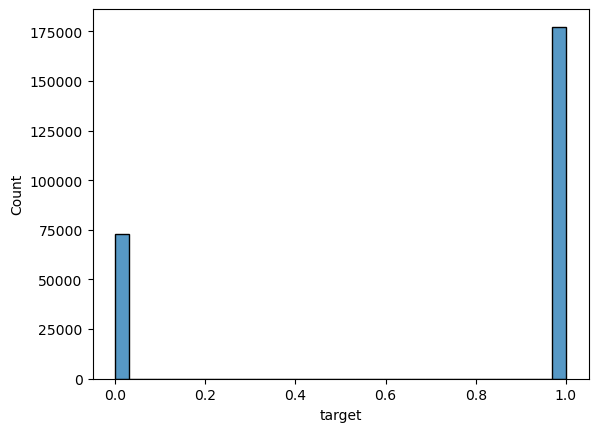

In [70]:
sns.histplot(train[TARGET])

<Axes: xlabel='target', ylabel='Count'>

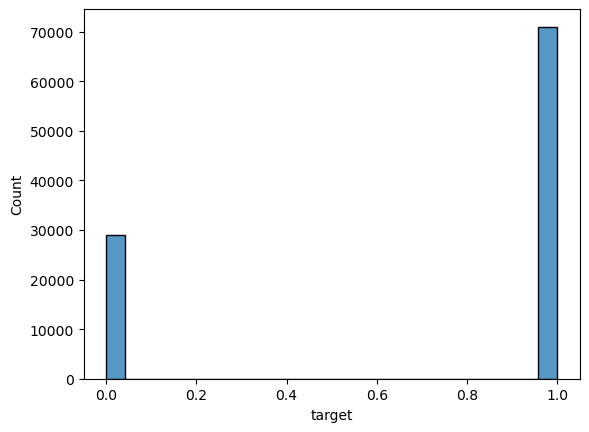

In [71]:
sns.histplot(val[TARGET])

#### Выводы: дисбаланс классов. Желательно использовать стратифицированное сэмплирование

# Бустинг

## Подбор гиперпараметров бустинга (3 балла)

Теперь подберем оптимальные гиперпараметры бустинга.

In [76]:
# В переменную features_optuna положите список признаков с предыдущего шага
# features_optuna = <your features>

features_optuna = features_final

**Задание:** Заполните пропуски в коде ниже и подберите оптимальные гиперпараметры.

Для успешного решения необходимо преодолеть порог ROC-AUC `0.725` на тестовой выборке.

**Я немного изменю код, так как сплит сделал самостоятельно (тут он выбирается через фильтр)**

In [79]:
def objective(trial):
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 10, 200),
        #####
        # your code here
        # Тут вы можете добавить любые гиперпараметры LGBMClassifier (например, что-то из того, что разбирали в лекции)
        #####

        # что-то базовое
        'objective': 'binary',
        'metric': 'auc',
        'verbosity': -1,
        'boosting_type': 'gbdt',


        "n_estimators": trial.suggest_int("n_estimators", 200, 3000),

        "max_depth": trial.suggest_int("max_depth", 3, 12),

        'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        # 'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
        
        # интересно попробовать, нашел в документации
        'data_sample_strategy': 'bagging', # оставлю так, не очень понял преимущества GOSS в нашей задаче
        # early_stopping_round 
        
        # Note: while enabling this should increase the overall performance metric of your model, 
        # it will also result in poor estimates of the individual class probabilities
        # Note: this parameter cannot be used at the same time with scale_pos_weight, choose only one of them
        'is_unbalance': True,

        'n_jobs': -1,

        'random_state': 42
    }
    
    # clf = LGBMClassifier(**params)
    # clf.fit(
    #     X=df.loc[df['sample_part'] == 'train', features_optuna],
    #     y=df.loc[df['sample_part'] == 'train', TARGET]
    # )
    # preds = clf.predict_proba(df.loc[df['sample_part'] == 'val', features_optuna])[:, 1]
    # auc_valid = roc_auc_score(
    #     y_true=df.loc[df['sample_part'] == 'val', TARGET],
    #     y_score=preds
    # )
    clf = LGBMClassifier(**params)

    clf.fit(
        X=train[features_optuna],
        y=train[TARGET]
    )
    
    preds = clf.predict_proba(val[features_optuna])[:, 1]
    auc_valid = roc_auc_score(
        y_true=val[TARGET],
        y_score=preds
    )
    
    return auc_valid

In [80]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

[I 2026-02-08 13:22:17,306] A new study created in memory with name: no-name-78fd8dd0-542f-4952-850f-c7176dc4fa44
[I 2026-02-08 13:23:40,581] Trial 0 finished with value: 0.7474958606119476 and parameters: {'learning_rate': 0.015510297061334858, 'num_leaves': 116, 'n_estimators': 951, 'max_depth': 11, 'feature_fraction': 0.8962408162908644, 'bagging_fraction': 0.5721189932841437, 'bagging_freq': 8, 'lambda_l1': 0.25724419435600104, 'lambda_l2': 3.8168401580328e-08}. Best is trial 0 with value: 0.7474958606119476.
[I 2026-02-08 13:26:53,329] Trial 1 finished with value: 0.7541313127731909 and parameters: {'learning_rate': 0.016213044456709194, 'num_leaves': 187, 'n_estimators': 2017, 'max_depth': 8, 'feature_fraction': 0.59584044357557, 'bagging_fraction': 0.9181322319435823, 'bagging_freq': 7, 'lambda_l1': 5.456326538112465e-07, 'lambda_l2': 0.11702251446504433}. Best is trial 1 with value: 0.7541313127731909.
[I 2026-02-08 13:27:38,240] Trial 2 finished with value: 0.7418894657600777 

**Не вижу улучшений, остановлюсь, так как обучаюсь очень долго с ноутбука**

In [82]:
print(study.best_params)

{'learning_rate': 0.022511004517451885, 'num_leaves': 96, 'n_estimators': 2485, 'max_depth': 10, 'feature_fraction': 0.6349898354943739, 'bagging_fraction': 0.6072608207402718, 'bagging_freq': 10, 'lambda_l1': 0.0002798699047466125, 'lambda_l2': 7.151765760948411e-08}


#### Зафиксирую для train/val

In [153]:
params = study.best_params

clf = LGBMClassifier(**params)

clf.fit(
    X=train[features_optuna],
    y=train[TARGET]
)

preds = clf.predict_proba(val[features_optuna])[:, 1]
auc_valid = roc_auc_score(
    y_true=val[TARGET],
    y_score=preds
)

In [84]:
# clf = LGBMClassifier(**study.best_params)
# clf.fit(
#     X=df.loc[df['sample_part'] == 'train', features_optuna],
#     y=df.loc[df['sample_part'] == 'train', TARGET]
# )

# preds_test = clf.predict_proba(df.loc[df['sample_part'] == 'test', features_optuna])[:, 1]
# auc_test = roc_auc_score(
#     y_true=df.loc[df['sample_part'] == 'test', TARGET],
#     y_score=preds_test
# )
# assert auc_test > 0.725, f'Необходимое значение ROC-AUC 0.725 и выше, ваше значение: {auc_test}!'

clf = LGBMClassifier(**study.best_params)

clf.fit(
    X=train[features_optuna],
    y=train[TARGET]
)

preds_test = clf.predict_proba(test[features_optuna])[:, 1]
auc_test = roc_auc_score(
    y_true=test[TARGET],
    y_score=preds_test
)

assert auc_test > 0.725, f"Необходимое значение ROC-AUC 0.725 и выше, ваше значение: {auc_test}!"

In [139]:
auc_test

0.7395093065500715

## Кривые накопления (2 балла)

**Задание:** Отрисуйте кривые накопления `ROC AUC` от `n_estimators` для бустинга с гиперпараметрами из предыдущего пункта.

**Hint:** для получения auc на каждой итерации обучения `LGBMClassifier`, можно воспользоваться параметрами `eval_set`, `eval_metric` и в методе `fit`. 

**Имеется в виду именно число последовательно добавляемых деревьев же, не итерации точно? n_estimators (int, optional (default=100)) – Number of boosted trees to fit.**

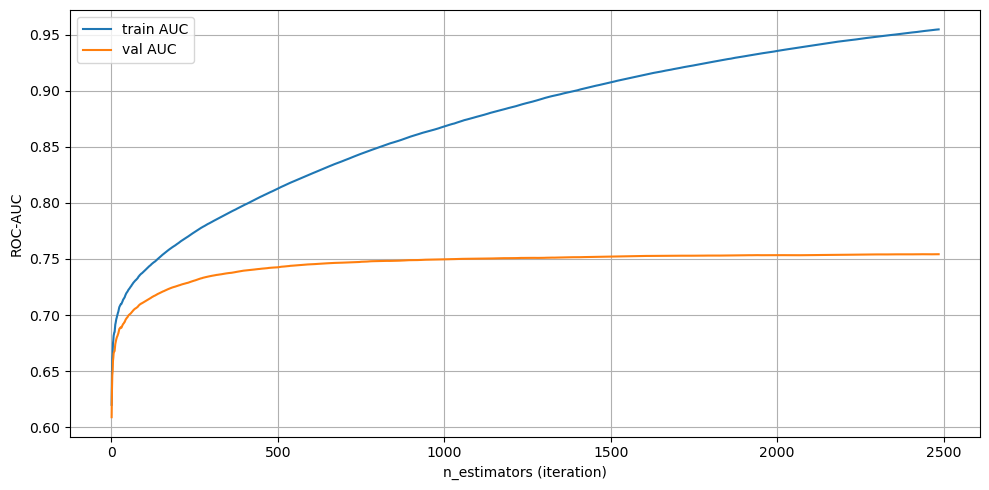

In [155]:
#####
# <your code here>
#####

params = study.best_params.copy()
params.update({"random_state": 42, "n_jobs": -1, "verbosity": -1})

clf = LGBMClassifier(**params)
clf.fit(
    X=train[features_optuna],
    y=train[TARGET],
    eval_set=[(train[features_optuna], train[TARGET]),
              (val[features_optuna],   val[TARGET])],
    eval_metric="auc",
)

res = clf.evals_result_
k_train, k_val = list(res.keys())[:2]

train_auc = res[k_train]["auc"]
val_auc   = res[k_val]["auc"]

iters = np.arange(1, len(val_auc) + 1)

plt.figure(figsize=(10, 5))
plt.plot(iters, train_auc, label="train AUC")
plt.plot(iters, val_auc,   label="val AUC")
plt.xlabel("n_estimators (iteration)")
plt.ylabel("ROC-AUC")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [156]:
preds = clf.predict_proba(val[features_optuna])[:, 1]
auc_valid = roc_auc_score(val[TARGET], preds)
print("val ROC-AUC:", auc_valid, "| best val AUC on curve:", float(np.max(val_auc)), "at iter", int(np.argmax(val_auc)+1))

val ROC-AUC: 0.7542469407479359 | best val AUC on curve: 0.7542554264205925 at iter 2483


**Вопрос:** Что вы видите на полученных графиках? 

Нужно ли "обрезать" количество деревьев? Ответ обоснуйте.

**Да, считаю, что нужно; можно ограничить параметр `n_estimators=+-1000`, - уже даст в целом достаточное количество деревьев для хорошего фита, но мы не будем тратить лишний раз время тяжелые итерации при переборе в Optuna. Сам по себе прирост есть послее значения `1000`, но он уже достаточно незначительный и нельзя с уверенностью сказать, что этот прирост заметен на test (если в принципе есть и мы не переобучаемся).**

## Важность признаков (1 балл)

**Задание:** Постойте гистограмму важности признаков по `split` и `gain` для бустинга из предыдущего пункта.

In [167]:
import lightgbm as lgb

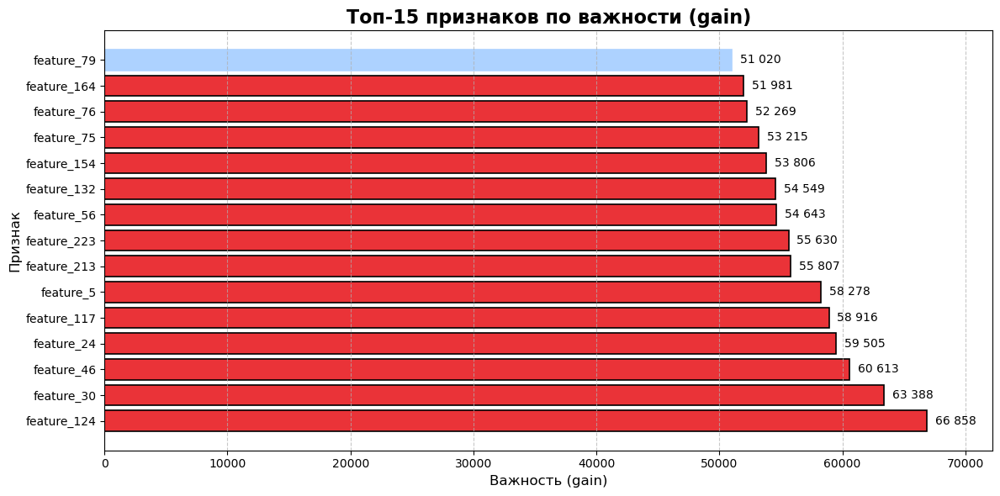

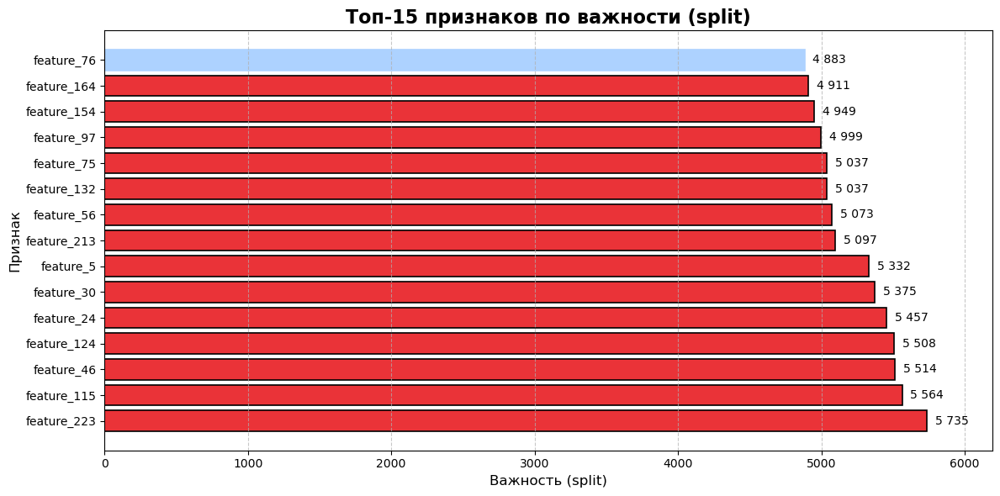

In [185]:
model_lgb = clf
booster = model_lgb.booster_

for imp_type, title in [("gain", "Топ-15 признаков по важности (gain)"),
                        ("split", "Топ-15 признаков по важности (split)")]:
    imp = pd.Series(
        booster.feature_importance(importance_type=imp_type),
        index=booster.feature_name()
    ).sort_values(ascending=False).head(15)

    plt.figure(figsize=(12, 6))
    bars = plt.barh(
        imp.index[::-1],
        imp.values[::-1],
        color="#EA3338",
        edgecolor="black",
        linewidth=1.2
    )
    if len(bars) > 0:
        bars[0].set_color("#ADD2FF")

    xmax = max(imp.values) if len(imp) else 0
    pad = xmax * 0.01
    for b in bars:
        w = b.get_width()
        plt.text(w + pad, b.get_y() + b.get_height()/2,
                 f"{w:,.0f}".replace(",", " "),
                 va="center", ha="left", fontsize=10)

    plt.title(title, fontsize=16, fontweight="bold")
    plt.xlabel(f"Важность ({imp_type})", fontsize=12)
    plt.ylabel("Признак", fontsize=12)
    plt.gca().invert_yaxis()
    plt.grid(True, linestyle="--", alpha=0.7, axis="x")
    plt.xlim(0, xmax * 1.08)
    plt.tight_layout()
    plt.show()

**Вопрос:** Какие выводы можно сделать из полученных графиков?

**В обоих топах повторяются многие фичи (например feature_164, feature_76, feature_154, feature_75, feature_132, feature_56, feature_213, feature_5, feature_30, feature_24, feature_46, feature_124, feature_223).**

**Глобально, важно обращать внимание по большей части именно на gain. Но, для окончательных выборов, я бы попробовал разные техники отбора признаков (попробую в творческой части задания!)**

# Логрег

## plot_metric_time (1 балл)

**Задание:** Реализуйте функцию plot_metric_time, которая будет принимать на вход четыре аргумента, а именно: 
- массив значений фичи, 
- массив значений таргета,
- массив времени (аггрегированного по месяцам или кварталам, то есть `month` или `quarter` в вашей задаче, по дням рисовать не надо),
- метрику, которую необходимо отрисовать (нужно реализовать функцию для двух метрик: `IV` и `roc_auc`)
- число бакетов для вычисления `IV`, если выбрана эта метрика

Можете добваить какие-то ещё аргументы, если вам нужно

Если в фиче есть пропуски, функция должна убирать строки с пропусками из рассмотрения

**Hint**: можно, конечно, реализовать эту функцию через цикл, а можно попробовать разобраться и реализовать её через пандасовские `groupby` -> `apply`, это изящнее и быстрее

In [197]:
import plotly.graph_objects as go

In [246]:
def plot_metric_time(
        values: pd.Series,
        target: pd.Series,
        time: pd.Series,
        metric: str = 'IV',
        n_buckets_for_IV: int = 15
) -> go.Figure:

    # код тут
    dfm = pd.DataFrame({"x": values, "y": target, "t": time}).dropna(subset=["x", "y", "t"])
    dfm["y"] = dfm["y"].astype(int)

    if metric == "IV":
        def _iv_group(g):
            x = g["x"]
            y = g["y"].to_numpy()

            k = min(n_buckets_for_IV, x.nunique(dropna=True))
            if k <= 1:
                return 0.0

            try:
                buckets = pd.qcut(x, q=k, labels=False, duplicates="drop").to_numpy()
            except Exception:
                buckets = pd.cut(x, bins=k, labels=False).to_numpy()

            return calc_iv(values=x.to_numpy(), target=y, buckets=buckets)

        series_metric = dfm.groupby("t", sort=True).apply(_iv_group)

    elif metric == "roc_auc":
        def _auc_group(g):
            y = g["y"]
            x = g["x"]
            if y.nunique() < 2:
                return np.nan
            return roc_auc_score(y_true=y, y_score=x)

        series_metric = dfm.groupby("t", sort=True).apply(_auc_group)

    else:
        raise NotImplementedError("only 'IV' and 'roc_auc' metrics are implemented")

    series_metric = series_metric.sort_index()
    x_axis = series_metric.index
    y_axis = series_metric.values

    plot_title = f"{values.name}, {metric} in time"
    fig = go.Figure()
    fig.add_trace(
        go.Scatter(
            x=x_axis,
            y=y_axis,
            mode="markers+lines",
            name=values.name
        )
    )
    fig.update_layout(
        title_text=plot_title,
        yaxis=dict(title=metric),
        width=1000,
        height=450,
        xaxis=dict(
            domain=[0, 0.95],
            showgrid=True,
            tickvals=list(x_axis),
        ),
        margin=dict(l=30, r=30, b=30, t=50),
    )
    # fig.show()
    return fig

In [251]:
# # примерно так это должно будет выглядеть
# plot_metric_time(df[...], df['target'], df['quarter']) # 

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



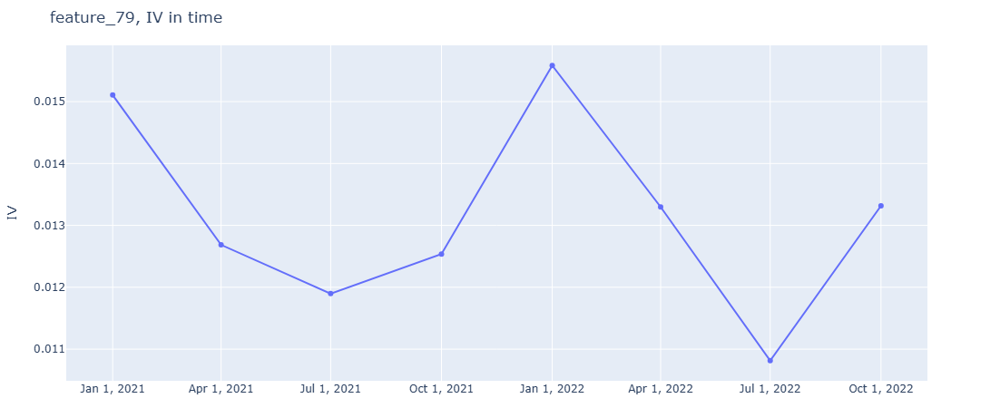

In [253]:
# примерно так это должно будет выглядеть
plot_metric_time(df["feature_79"], df["target"], df["quarter"], metric="IV", n_buckets_for_IV=15)

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:39: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



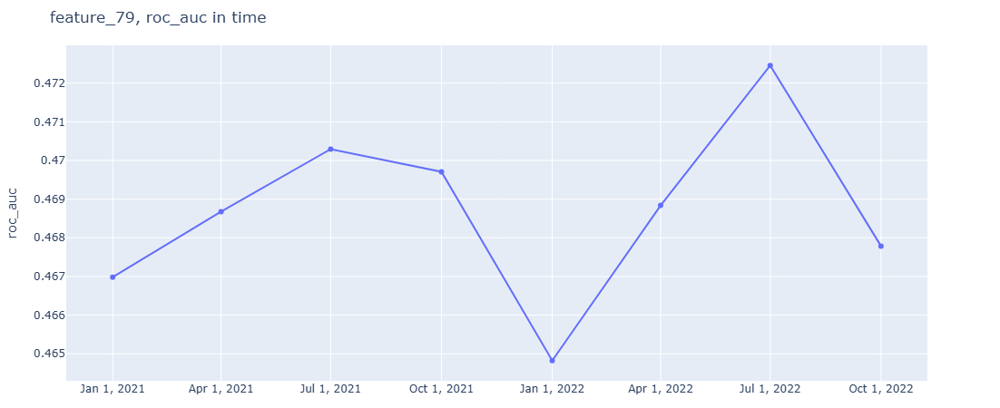

In [254]:
plot_metric_time(df["feature_79"], df["target"], df["quarter"], metric="roc_auc")

**Задание:** Возьмите **топ-15** фичей получившегося бустинга по важности по `gain`. Отрисуйте для них графики стабильности по `IV` во времени и удалите из рассмотрения те признаки, качество которых деградирует

**NB!** Обращайте внимание на масштаб оси *y!* Иногда признак стабильнее, чем кажется)

Если вам это мешает, можете поменять ось *y*, чтобы она начиналась от нуля в прошлом задании.

In [257]:
# your code here

Список

In [228]:
features = [
    "feature_79",
    "feature_164",
    "feature_76",
    "feature_75",
    "feature_154",
    "feature_132",
    "feature_56",
    "feature_223",
    "feature_213",
    "feature_5",
    "feature_117",
    "feature_24",
    "feature_46",
    "feature_30",
    "feature_124",
]

In [232]:
train[features].nunique()

feature_79     250000
feature_164    250000
feature_76     250000
feature_75     250000
feature_154    250000
feature_132    250000
feature_56     250000
feature_223    213266
feature_213    250000
feature_5      250000
feature_117    250000
feature_24     250000
feature_46     250000
feature_30     232740
feature_124    220520
dtype: int64

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



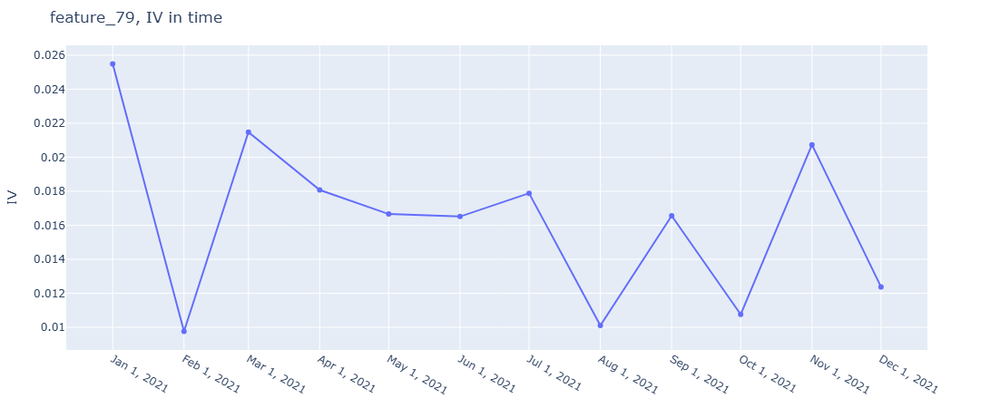

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



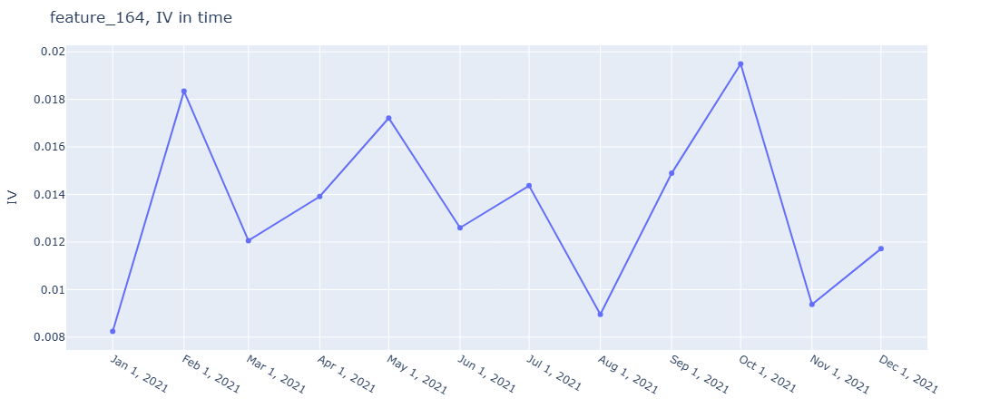

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



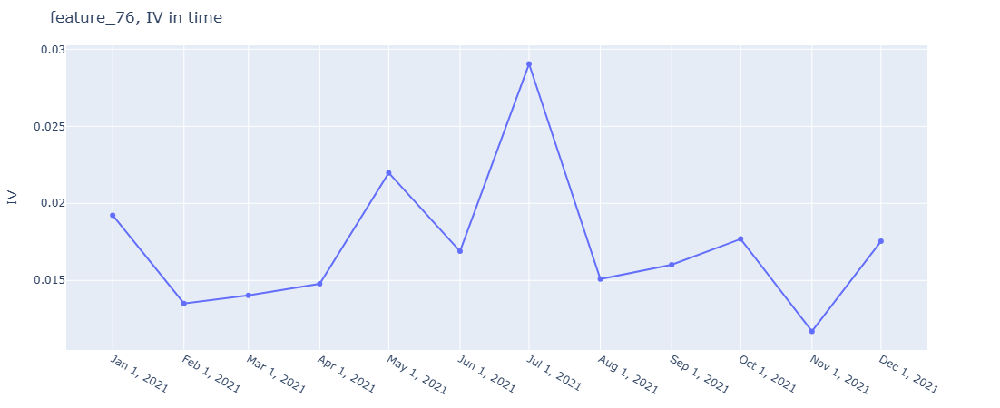

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



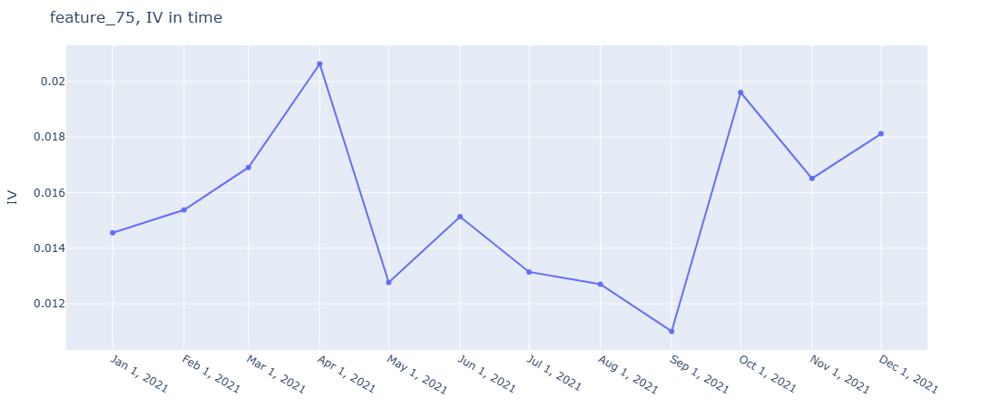

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



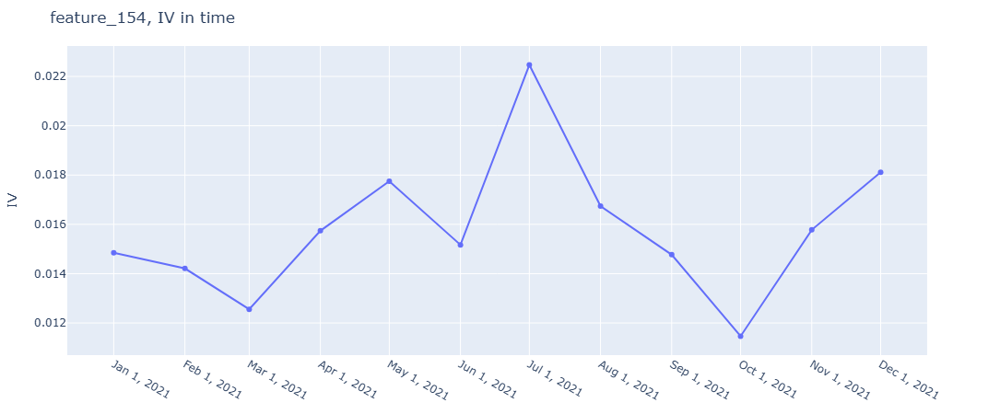

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



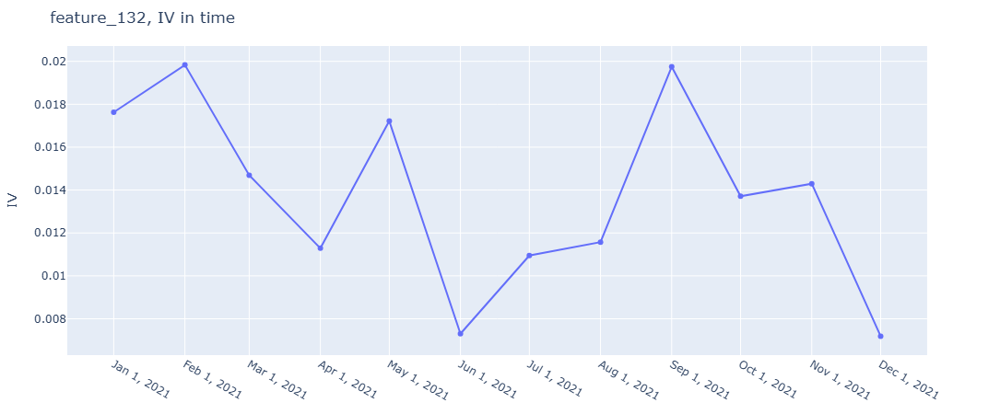

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



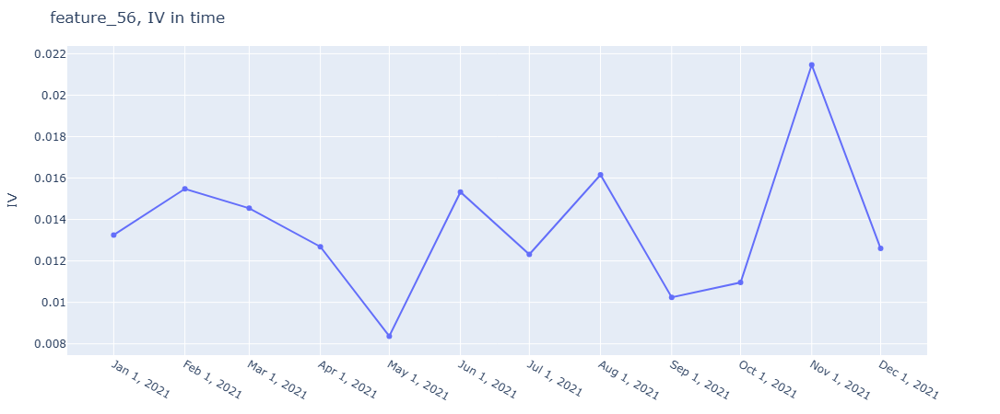

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



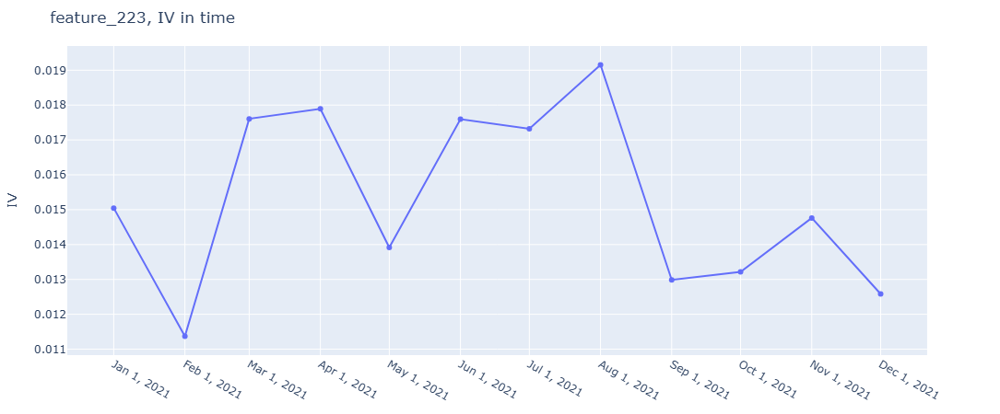

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



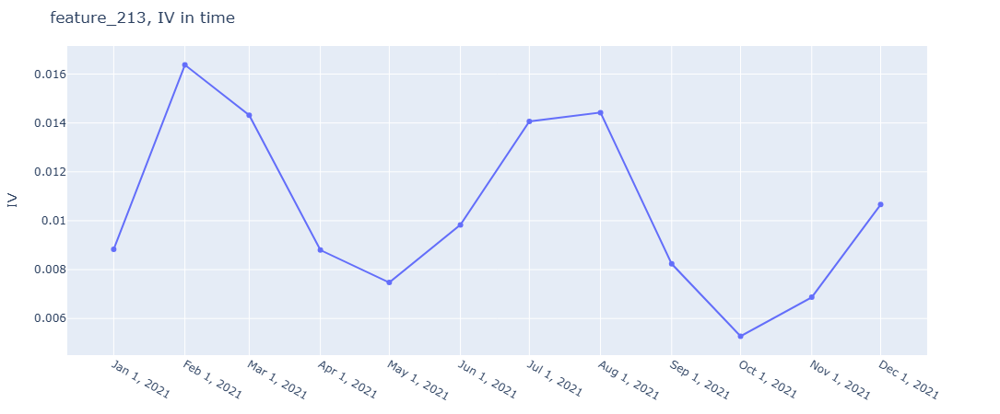

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



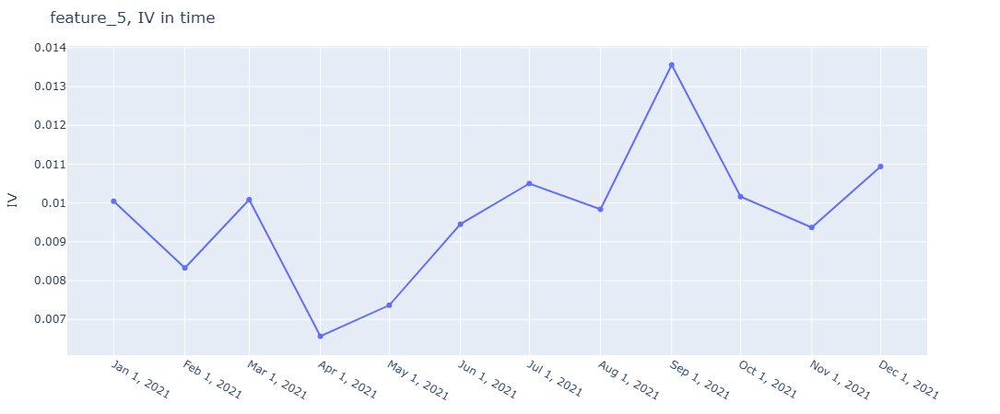

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



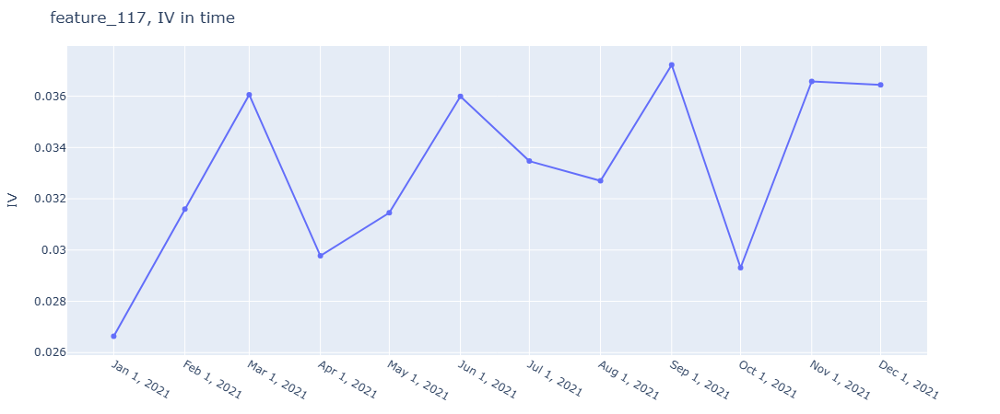

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



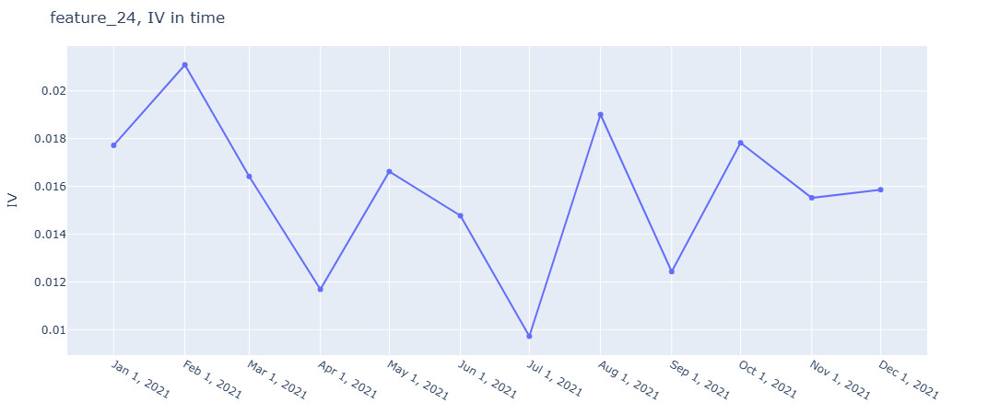

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



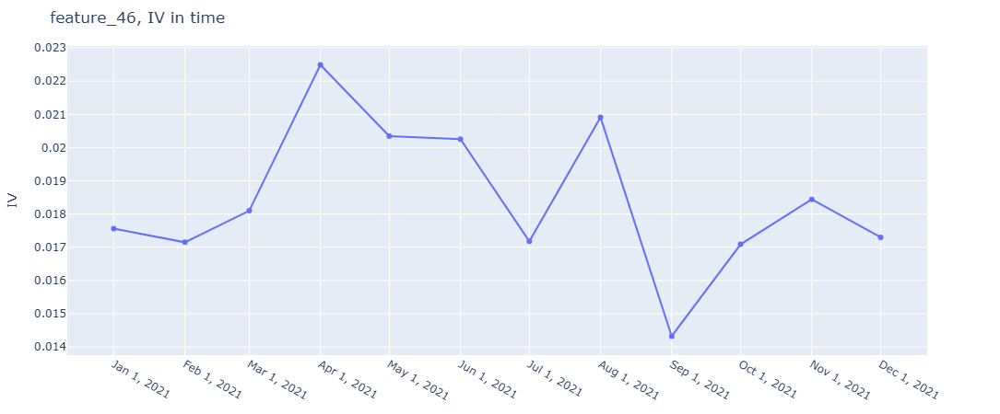

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



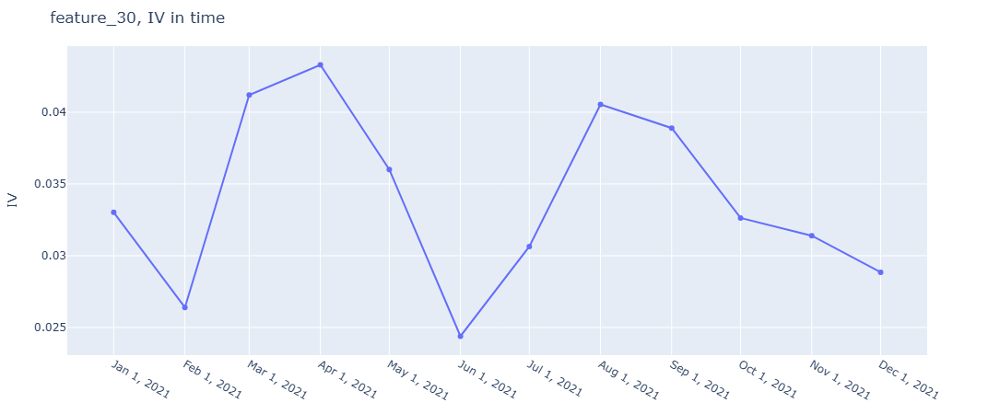

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\1679618361.py:29: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



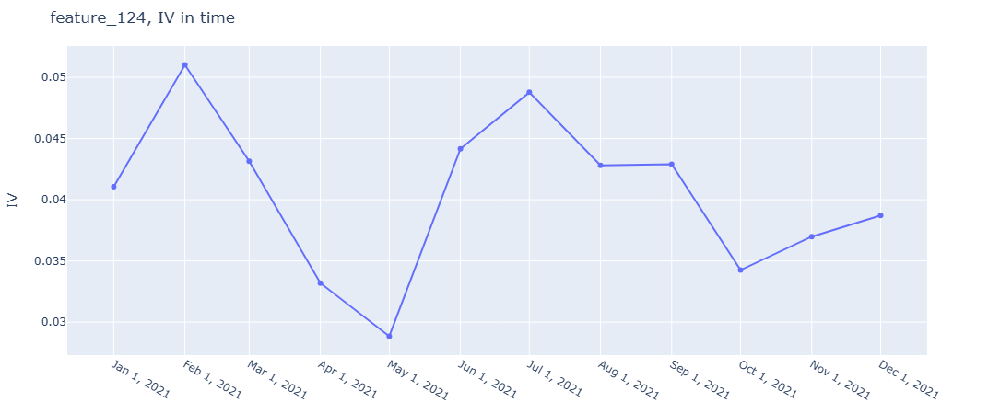

In [264]:
for f in features:
    fig = plot_metric_time(train[f], train[TARGET], train["month"], metric="IV", n_buckets_for_IV=20)
    fig.show()

**Лично мне не очень нравится признак 132, - слишком сильное падание заметно. Я бы убрал только его, так как с остальными нельзя однозначно сказать, что IV имеет именно негативный тренд, а не просто временно падает.**

Предлагаю подытожить признаковый набор:

In [268]:
# features_final = selected_features_cat_train + selected_features_train

features_final = [f for f in features_final if f != "feature_132"]

На этом моменте предлагаю сделать новый маленький датафрейм, чтобы не "портить" исходный

И проводить все манипуляции с фичами на нём

In [272]:
features_gain = [
    "feature_79",
    "feature_164",
    "feature_76",
    "feature_75",
    "feature_154",
    "feature_132",
    "feature_56",
    "feature_223",
    "feature_213",
    "feature_5",
    "feature_117",
    "feature_24",
    "feature_46",
    "feature_30",
    "feature_124",
]

features_gain = [f for f in features_gain if f != "feature_132"]

top15features_stable = features_gain

In [274]:
df_for_logreg = df[top15features_stable + ['date', 'month', 'quarter', 'target', 'sample_part']]

In [280]:
df_for_logreg[top15features_stable].nunique()

feature_79     500000
feature_164    500000
feature_76     500000
feature_75     500000
feature_154    500000
feature_56     500000
feature_223    426512
feature_213    500000
feature_5      500000
feature_117    500000
feature_24     500000
feature_46     500000
feature_30     465525
feature_124    441016
dtype: int64

## Предобработка признаков (3 балла)

**Задание:** Используя функицю woe_line из предыдущего ДЗ, проверьте **числовые** фичи из полученного списка фичей на линейность по WoE на трейн-выборке (если в фиче есть пропуски - дропаем их при отрисовке)

Если фичи нелинейные, **линеаризуйте их**.

Преобразования, которые можно/стоит пробовать:
- клипы (`np.clip`) - зачастую их достаточно
- корень
- квадрат
- логарифм

Если нужно, можно прибавлять к фиче константу или менять её знак

При желании можно "распилить фичу на две половины" (если она немонотонна) и линеаризовать их по отдельности

Однако слишком упираться в линеаризацию фичей не нужно. Если фича ну совсем никак не линеаризуется, в крайнем случае можно её дропнуть или оставить как есть.

При отрисовке можно ограничиться 15-20 бактеами

In [18]:
# your code here

In [326]:
from typing import Union, Tuple
from scipy.special import logit
from statsmodels.stats.proportion import proportion_confint

In [336]:
from sklearn.metrics import roc_auc_score

def calc_buckets(x : Union[np.ndarray, pd.Series], n_buckets : int) -> np.ndarray:
    """Разбивает массив значений признака x на 
    n_buckets бакетов"""

    x = pd.Series(x).reset_index(drop=True)
    buckets = x.rank(method="dense", pct=True) * n_buckets
    buckets = np.ceil(buckets) - 1   # np.floor дает другой результат для 5.0, 6.0 и т.д.
    buckets = np.array(buckets, dtype=np.int16)

    return buckets

def woe_ci(target : np.ndarray, buckets : np.ndarray, offset : float) -> Tuple[pd.Series]:
    """Для каждого бакета вычисляем WoE и доверительный интервал для него."""

    woe = {}
    woe_lower = {}
    woe_upper = {}


    for j in np.unique(buckets):
        mask = buckets == j
        y_j = target[mask]
        
        B_j = (y_j == 1).sum()
        G_j = (y_j == 0).sum()
        n_j = B_j + G_j
        
        # если WoE не определён
        if B_j == 0 or G_j == 0:
            woe[j] = np.nan
            woe_lower[j] = np.nan
            woe_upper[j] = np.nan
            continue
        
        # badrate
        badrate_j = B_j / n_j

        # доверительный интервал для badrate по Уилсону
        badrate_low, badrate_up = proportion_confint(
            count=B_j,
            nobs=n_j,
            alpha=0.05,
            method='wilson'
        )
        
        # переход к WoE
        woe[j] = woe_transform(badrate_j, offset)
        woe_lower[j] = woe_transform(badrate_low, offset)
        woe_upper[j] = woe_transform(badrate_up, offset)

    
    # # считаем бэдрейт и доверительный интервал для него (любым способом)
    # badrate, badrate_lower, badrate_upper = None, None, None

    # # переходим от бэдрейта к woe
    # woe, woe_lower, woe_upper = None, None, None

    # return woe, woe_lower, woe_upper

    return (
            pd.Series(woe).sort_index(),
            pd.Series(woe_lower).sort_index(),
            pd.Series(woe_upper).sort_index()
        )
    
def calc_buckets_info(values : np.ndarray, target : np.ndarray, buckets : np.ndarray) -> dict:
    """Для каждого бакета расчитывает
     - среднее значение признака
     - линейную интерполяцию в пространстве woe
     - значение woe и доверительный интервал для него"""

    # buckets_info = {
    #     "mean_feature" : None,
    #     "line"         : None,
    #     "woe"          : None,
    #     "woe_lower"    : None,
    #     "woe_upper"    : None
    # }

    # средние значения признака по бакетам
    mean_feature = (
        pd.Series(values)
        .groupby(buckets)
        .mean()
        .sort_index()
        .values
    )

    # offset
    B = (target == 1).sum()
    G = (target == 0).sum()
    offset = logit(B / (B + G))

    # WoE и доверительные интервалы
    woe, woe_lower, woe_upper = woe_ci(
        target=target,
        buckets=buckets,
        offset=offset
    )

    # линейная интерполяция
    line = calc_line(
        values=values,
        target=target,
        mean_feature=mean_feature,
        offset=offset
    )

    buckets_info = {
        "mean_feature": mean_feature,
        "line": line,
        "woe": woe,
        "woe_lower": woe_lower,
        "woe_upper": woe_upper
    }

    return buckets_info
    
def calc_plot_title(
        values : np.ndarray,
        target : np.ndarray,
        buckets : np.ndarray
    ) -> str:
    """Считает для признака roc auc, IV, R^2"""
    # auc = None
    auc = roc_auc_score(target, values)

    # формула выше
    # IV = None

    B = (target == 1).sum()
    G = (target == 0).sum()

    IV = 0.0

    for j in np.unique(buckets):
        mask = buckets == j
        y_j = target[mask]

        B_j = (y_j == 1).sum()
        G_j = (y_j == 0).sum()
        
        if B_j == 0 or G_j == 0:
            continue

        woe_j = np.log((B_j / G_j) / (B / G))

        IV += (B_j / B - G_j / G) * woe_j

    # используем ранее написанную функцию
    info = calc_buckets_info(
        values=values,
        target=target,
        buckets=buckets
    )

    mean_feature = info["mean_feature"]
    woe = info["woe"].values
    line = info["line"]

    # веса бакетов - число наблюдений в бакете
    weights = np.array([
        (buckets == j).sum()
        for j in np.unique(buckets)
    ])

    # Взвешенный R^2 
    # X - среднее в бакете, Y - woe в бакете, вес - число наблюдений в бакете
    # R_sqr = None
    w_mean = np.average(woe, weights=weights)
    ss_tot = np.sum(weights * (woe - w_mean) ** 2)

    # линейная инт.
    ss_res = np.sum(weights * (woe - line) ** 2)

    R_sqr = 1 - ss_res / ss_tot

    plot_title = (        
        f"AUC = {auc:.3f} "
        f"IV = {IV:.3f} "
        f"R_sqr = {R_sqr:.3f} "
    )

    return plot_title

# в этот код можно не въезжать :)
import plotly.graph_objects as go

def make_figure(buckets_info : dict, plot_title : str) -> go.Figure:
    """Строит график линейности."""
    fig = go.Figure()

    # общие настройки
    title = dict(
        text=plot_title,
        y=0.95,
        x=0.5,
        font=dict(size=12),
        xanchor="center",
        yanchor="top"
    )
    margin = go.layout.Margin(
        l=50,
        r=50,
        b=50,
        t=60
    )

    fig.add_trace(
        go.Scatter(
            x=buckets_info["mean_feature"],
            y=buckets_info["line"],
            mode='lines',
            name="interpolation_line",
            showlegend=False
        )
    )

    fig.add_trace(
        go.Scatter(
            x=buckets_info["mean_feature"],
            y=buckets_info["woe"],
            line=dict(
                color='firebrick',
                width=1,
                dash='dot'
            ),
            error_y=dict(
                type='data',
                symmetric=False,
                array=buckets_info["woe_upper"],
                arrayminus=buckets_info["woe_lower"]
            ),
            name="WoE",
            showlegend=False)
    )

    fig.update_layout(
        width=1000,
        height=450,
        xaxis_title=dict(
            text='Feature value',
            font=dict(size=12)
        ),
        yaxis_title=dict(
            text="WoE",
            font=dict(size=12)
        ),
        title=title,
        margin=margin
    )

    return fig

def woe_line(
        values : np.ndarray,
        target : np.ndarray,
        n_buckets : int
    ) -> go.Figure:
    """График линейности переменной по WoE."""
    buckets : np.ndarray = calc_buckets(values, n_buckets)
    buckets_info : pd.DataFrame = calc_buckets_info(values, target, buckets)
    plot_title : str = calc_plot_title(values, target, buckets)
    fig = make_figure(buckets_info, plot_title)
    return fig


def woe_transform(badrate : float, offset : float) -> float:
    """Считаем WoE для бакета с данным badrate и выборки
    с данным offset."""
    woe = logit(badrate) - offset
    return woe

from sklearn.linear_model import LogisticRegression

def calc_line(values : np.ndarray, target : np.ndarray, mean_feature : np.ndarray, offset : float) -> np.ndarray:
    """Строим линейную интерполяцию для WoE."""

    # строим логистическую регрессию на одном признаке
    # и считаем ее предсказания в точках - mean_feature
    
    # логрег на одном признаке
    lr = LogisticRegression(
        # penalty='None', # не регуляризую
        solver='lbfgs' # не принципиально, пробовал разные, результаты схожие 
        # (кроме того, что некоторые солверы игнорируют мультиколлинеарность)
    )
    
    # обучаем
    lr.fit(values.reshape(-1, 1), target)
    
    # предсказываем вероятность bad в точках mean_feature
    proba = lr.predict_proba(mean_feature.reshape(-1, 1))[:, 1]
    
    # применяем ранее написанную функцию
    line = woe_transform(proba, offset)
    return line

**Задание:** Используя функицю woe_line из предыдущего ДЗ, проверьте **числовые** фичи из полученного списка фичей на линейность по WoE на трейн-выборке (если в фиче есть пропуски - дропаем их при отрисовке)

Если фичи нелинейные, **линеаризуйте их**.

Преобразования, которые можно/стоит пробовать:
- клипы (`np.clip`) - зачастую их достаточно
- корень
- квадрат
- логарифм

Если нужно, можно прибавлять к фиче константу или менять её знак

При желании можно "распилить фичу на две половины" (если она немонотонна) и линеаризовать их по отдельности

Однако слишком упираться в линеаризацию фичей не нужно. Если фича ну совсем никак не линеаризуется, в крайнем случае можно её дропнуть или оставить как есть.

При отрисовке можно ограничиться 15-20 бактеами

Я буду использовать просто train set (это тот же сет, что и рассматриваем выше как датасет для логистической регрессии! Просто сразу подвыборка train. Причины, почему рассматриваю именно train, описал выше и задания позволяет слегка отклоняться от исходной логики поставленных вопросов).

Для признака feature_79


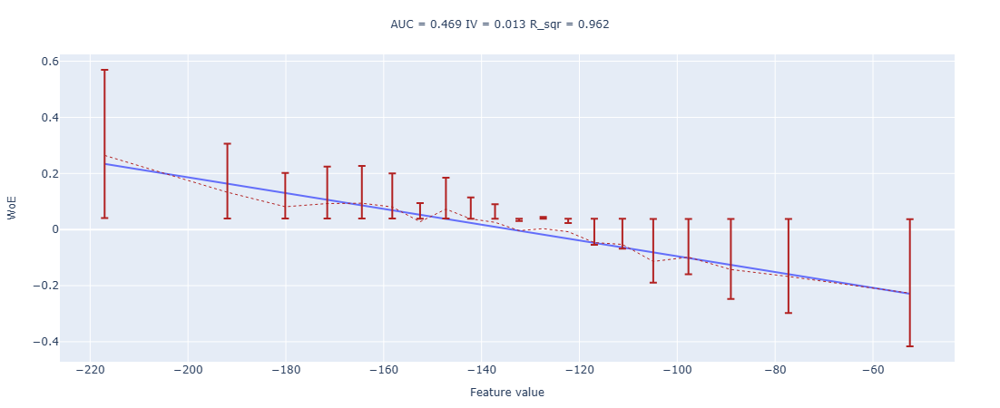

Для признака feature_164


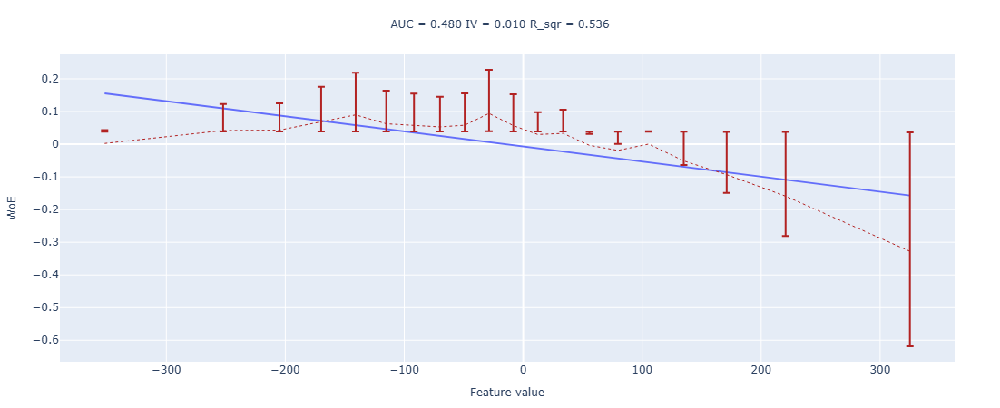

Для признака feature_76


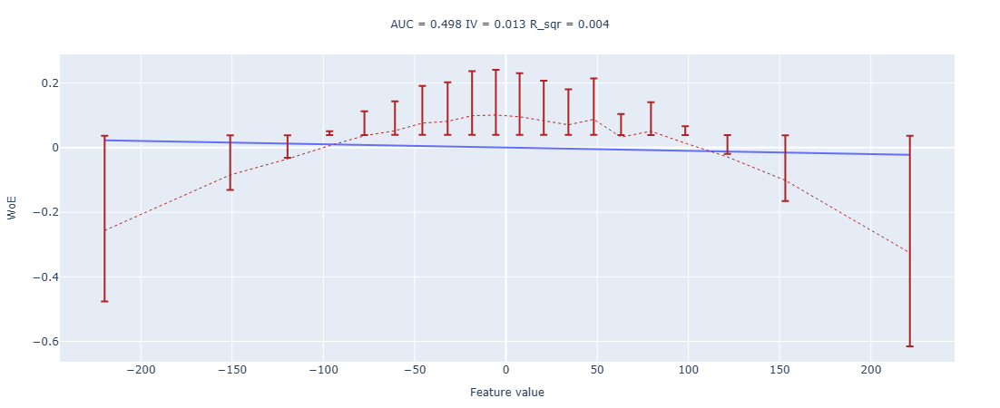

Для признака feature_75


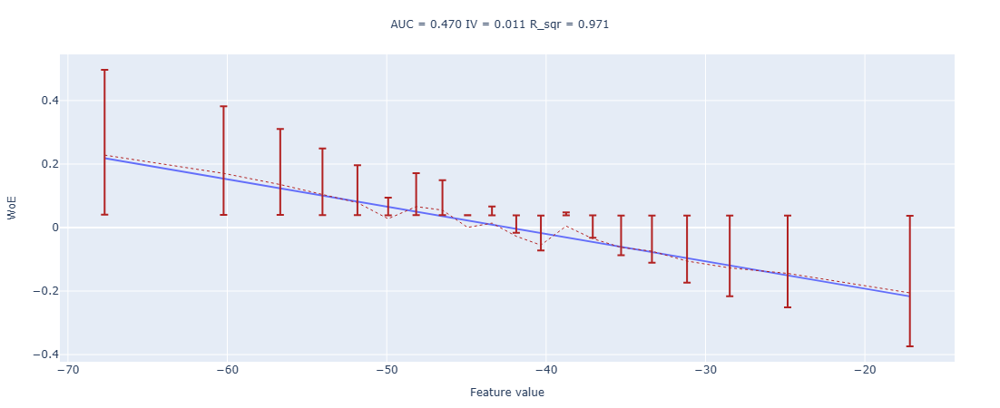

Для признака feature_154


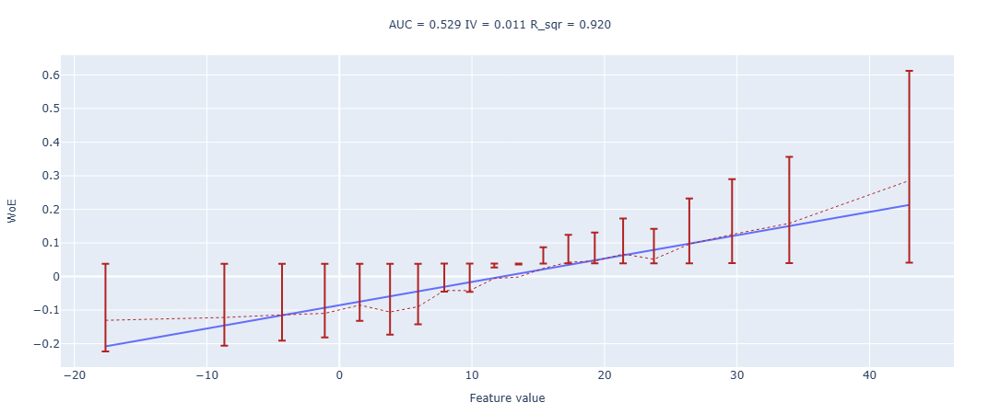

Для признака feature_56


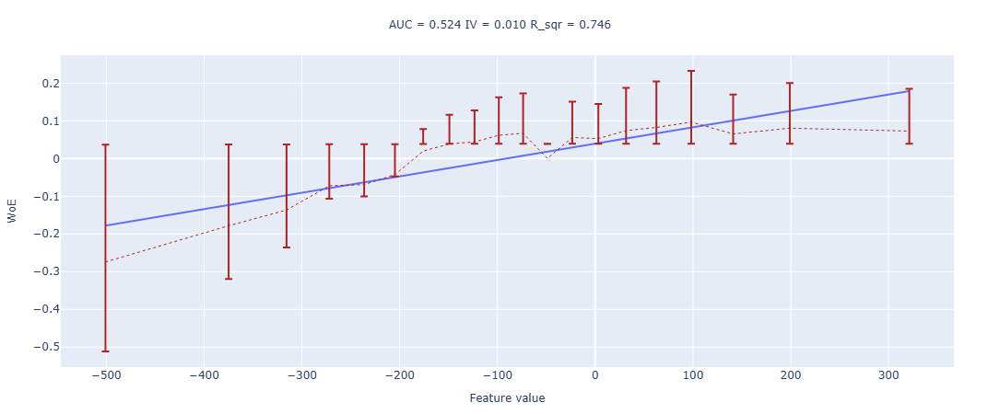

Для признака feature_223


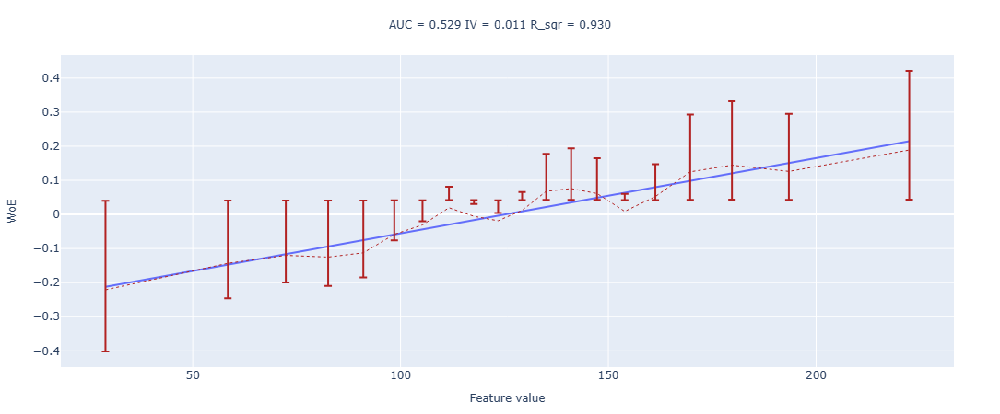

Для признака feature_213


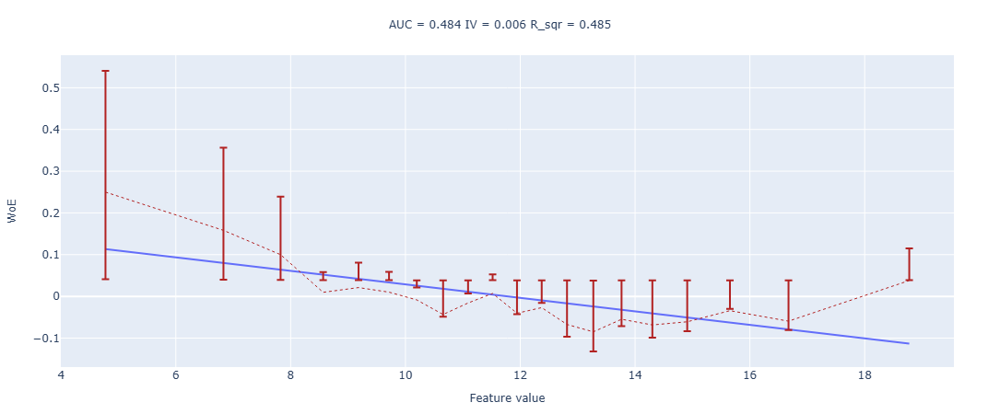

Для признака feature_5


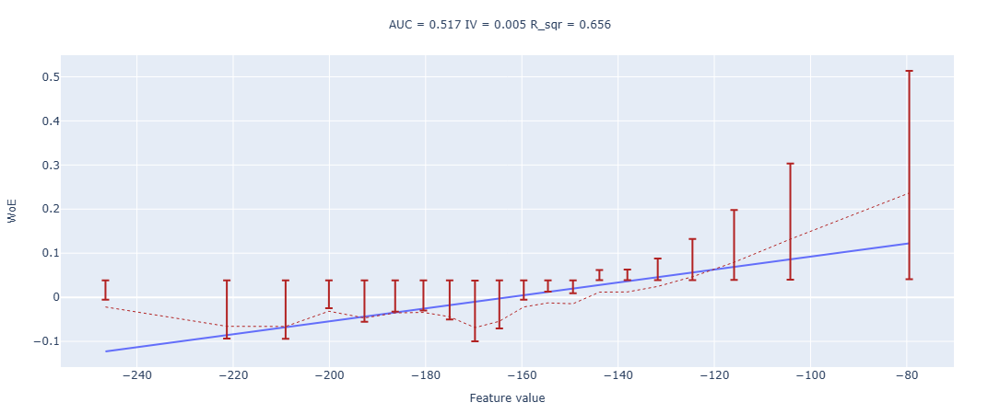

Для признака feature_117


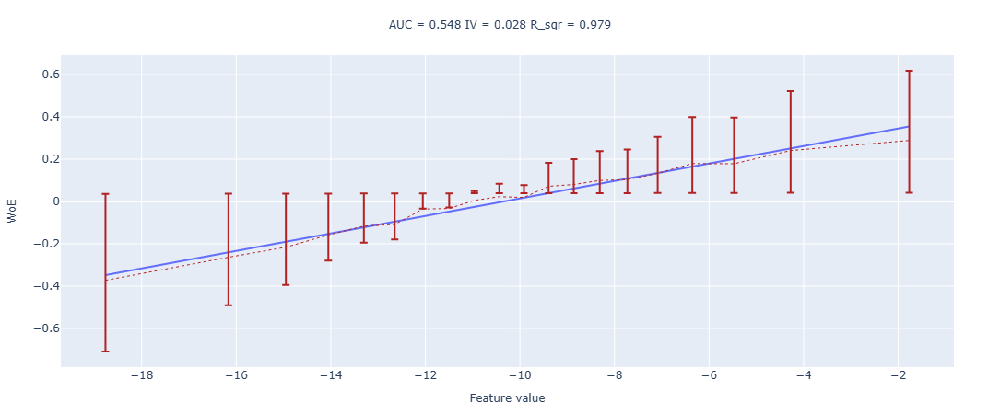

Для признака feature_24


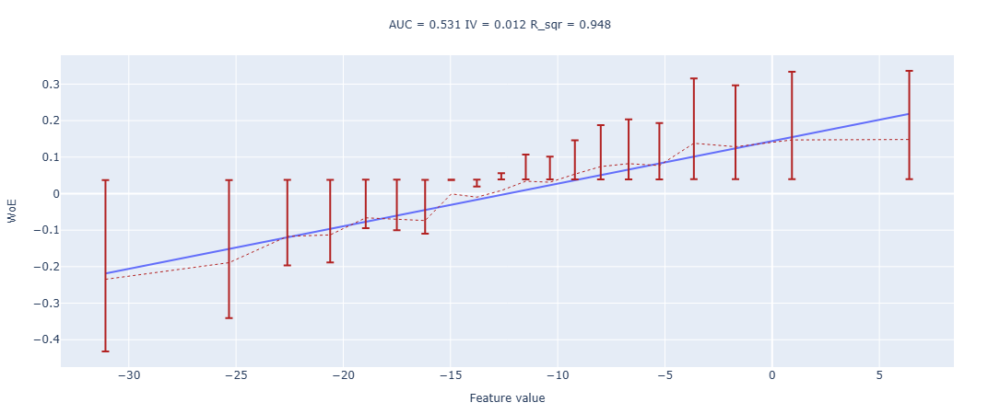

Для признака feature_46


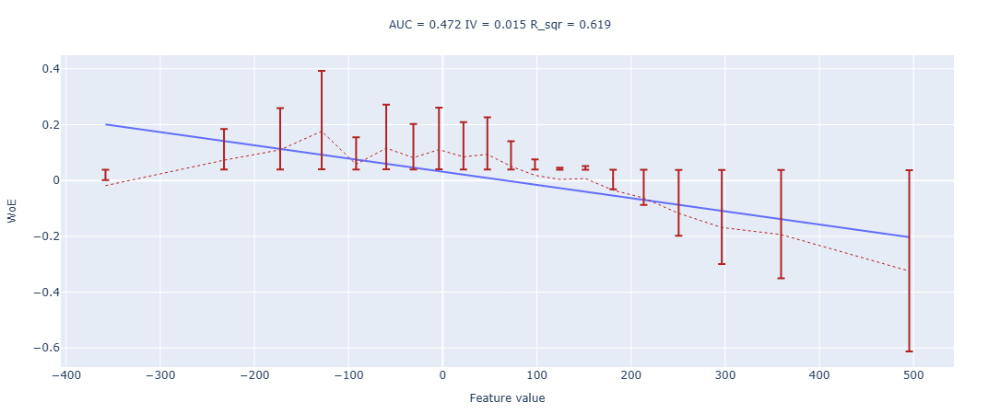

Для признака feature_30


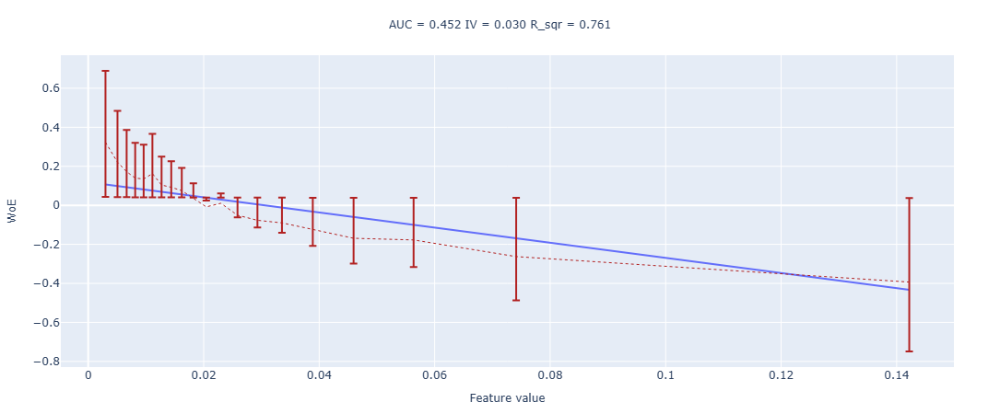

Для признака feature_124


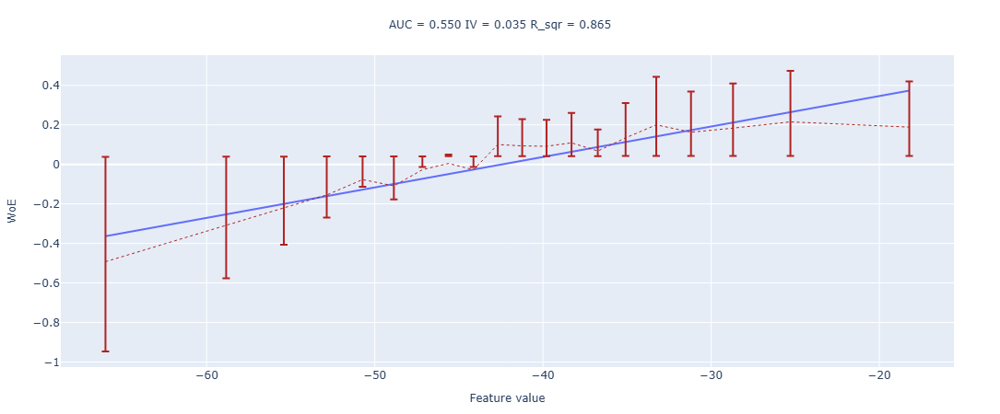

In [342]:
num_feats = [f for f in top15features_stable if pd.api.types.is_numeric_dtype(train[f])]
num_feats

for f in num_feats:
    print(f'Для признака {f}')
    m = train[f].notna()
    fig = woe_line(train.loc[m, f].to_numpy(), train.loc[m, TARGET].astype(int).to_numpy(), n_buckets=20)
    fig.show()

Признаки с индексами:
- 164
- 76
- 56
- 213
- 5
- 46
- 30

**Требуют линеаризации. Остальные признаки не пострадают от применения логарифма, так как это просто сгладит распределения и изменит масштабы (спорно, насколько лучше для дерева, хотя, может учиться быстрее, но точно лучше для логистической регрессии).
Поэтому применяю логарифмизацию на все признаки из списка.**

**СРАЗУ ВЕРДИКТ ПО ТЕЗИСУ ВЫШЕ: почти преобразования ухудшают метрики качества, проверил корень, логарифм, клиппинг. Но полиномиальные преобразования вида возведения в квадрат (куб улучшил только у самого проблемного признака и слегка) улучшают метрики У ПРОБЛЕМНЫХ признаков, но не делают этого (скорее, ухудшают) у изначально "хороших" по метрикам. Поэтому применю преобразования только к признакам из списка.**

In [549]:
df = pd.read_parquet('df.parquet')

In [550]:
train = df.query("sample_part == 'train'")
val = df.query("sample_part == 'val'")
test = df.query("sample_part == 'test'")

In [557]:
sq_cols = [f"{c}_squared" for c in sq_feats]

df_for_logreg = df_for_logreg.drop(columns=sq_cols, errors="ignore")

In [559]:
new_cols = [f"{c}_squared" for c in sq_feats]
print("overlap train:", set(new_cols) & set(train.columns))
print("overlap val:", set(new_cols) & set(val.columns))
print("overlap test:", set(new_cols) & set(test.columns))
print("overlap df_for_logreg:", set(new_cols) & set(df_for_logreg.columns))


overlap train: set()
overlap val: set()
overlap test: set()
overlap df_for_logreg: set()


In [561]:
sq_feats = [
    "feature_164","feature_76","feature_56","feature_213","feature_5","feature_46","feature_30",
]

q_low, q_high = 0.01, 0.99
lo = train[sq_feats].quantile(q_low)
hi = train[sq_feats].quantile(q_high)

def add_squared(df, feats, lo, hi, suffix="_squared"):
    clipped = df[feats].clip(lower=lo, upper=hi, axis=1)
    squared = np.power(clipped, 2)
    squared.columns = [f"{c}{suffix}" for c in feats]
    return df.join(squared)

train = add_squared(train, sq_feats, lo, hi)
val  = add_squared(val,  sq_feats, lo, hi)
test = add_squared(test, sq_feats, lo, hi)

df_for_logreg = add_squared(df_for_logreg, sq_feats, lo, hi)

In [563]:
train['feature_76_squared'].unique()

array([  600.81985736, 17405.16268576, 16940.64184534, ...,
        5016.75321701,  1343.47584447,  4884.49557618])

**Проверим!**

Для признака feature_164_squared


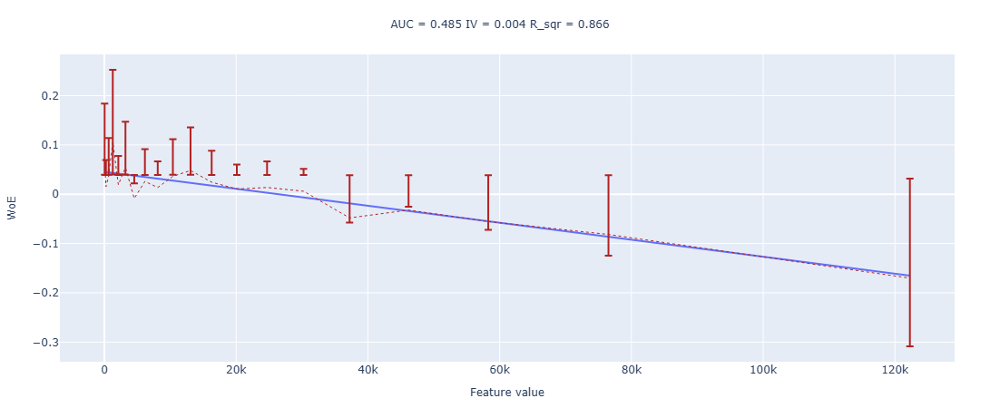

Для признака feature_76_squared


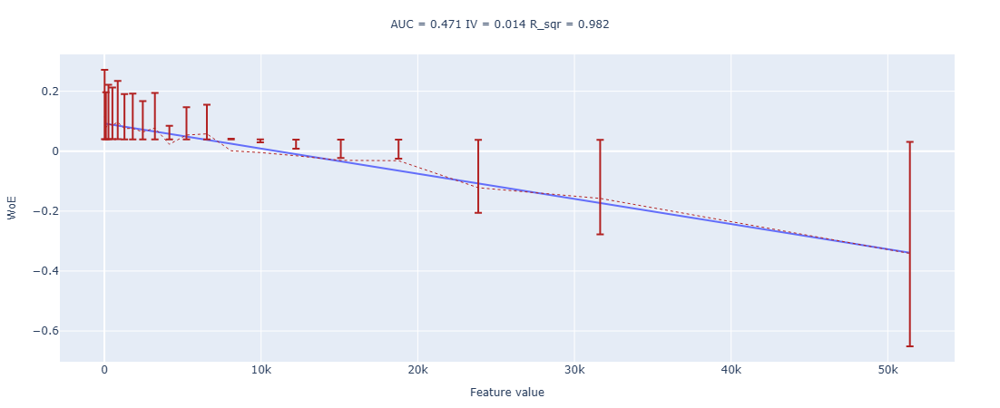

Для признака feature_56_squared


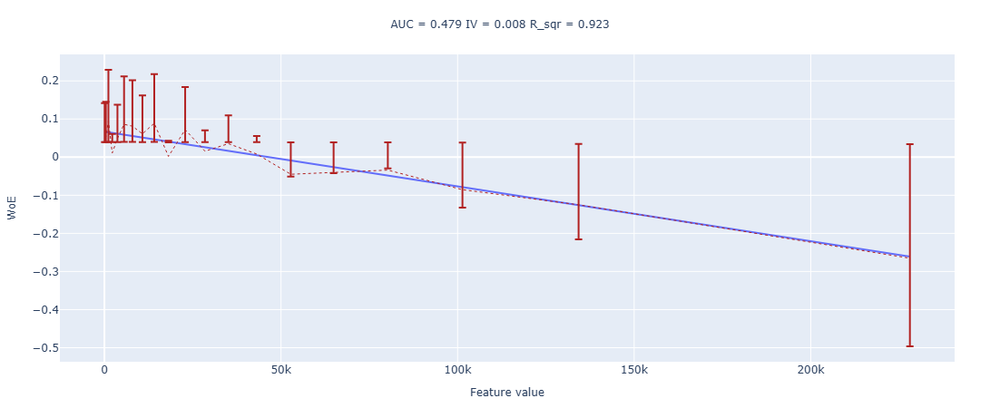

Для признака feature_213_squared


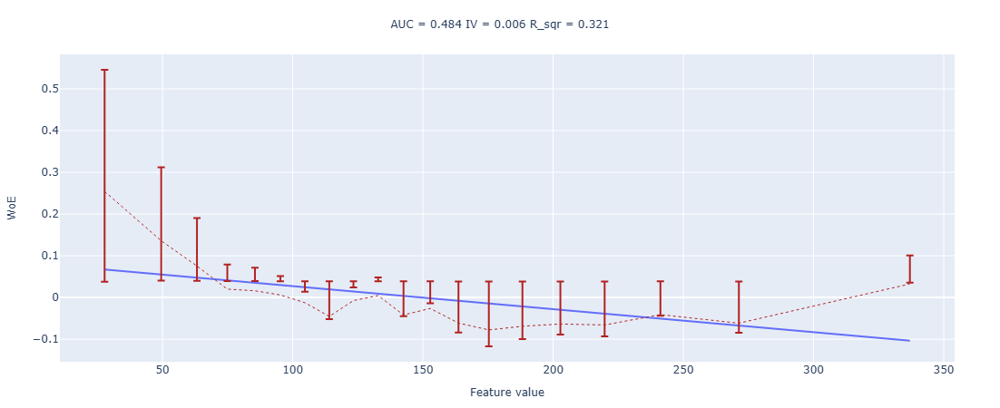

Для признака feature_5_squared


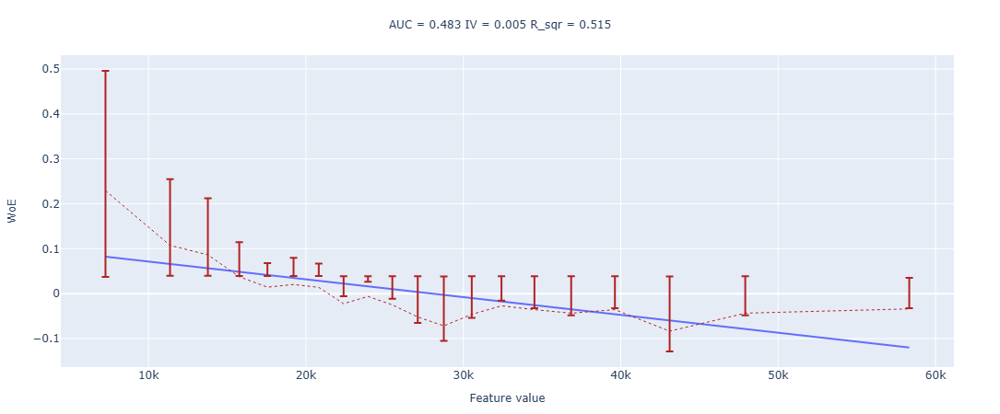

Для признака feature_46_squared


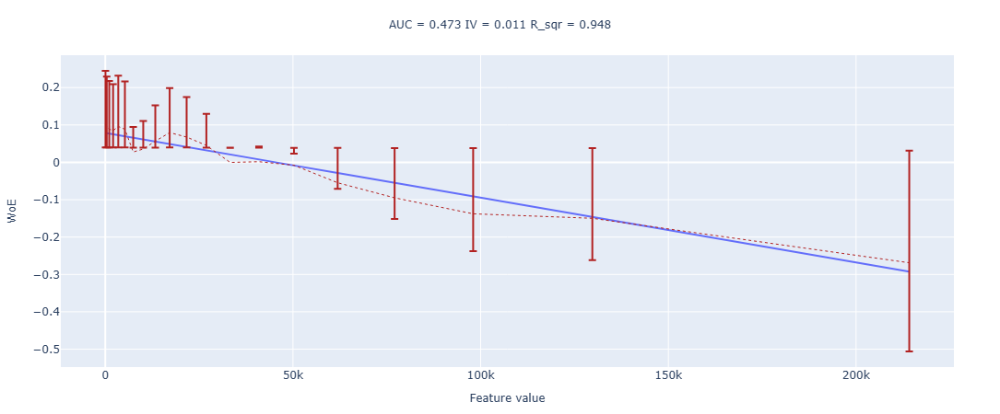

Для признака feature_30_squared


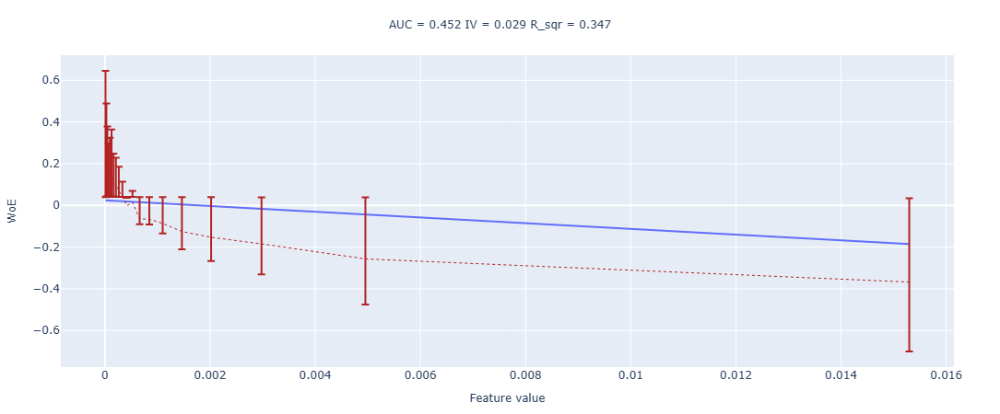

In [565]:
sq_feats = [
    "feature_164_squared",
    "feature_76_squared",
    "feature_56_squared",
    "feature_213_squared",
    "feature_5_squared",
    "feature_46_squared",
    "feature_30_squared",
]

sq_feats = [f for f in sq_feats if pd.api.types.is_numeric_dtype(train[f])]

for f in sq_feats:
    print(f"Для признака {f}")
    m = train[f].notna()
    fig = woe_line(
        train.loc[m, f].to_numpy(),
        train.loc[m, TARGET].astype(int).to_numpy(),
        n_buckets=20
    )
    fig.show()

**Выводы: улучшения есть! Признаки 213, 30 исключу перед дальнейшим рассмотрением**

In [569]:
features_all = [
    "feature_79",
    "feature_164_squared",
    "feature_76_squared",
    "feature_75",
    "feature_154",
    "feature_132",
    "feature_56_squared",
    "feature_223",
    "feature_213_squared",
    "feature_5_squared",
    "feature_117",
    "feature_24",
    "feature_46_squared",
    "feature_30_squared",
    "feature_124",
]


to_drop = {"feature_132", "feature_213", "feature_213_squared", "feature_30", "feature_30_squared"}

final_features_logreg = [f for f in features_all if f not in to_drop]


final_features_logreg = features_all

In [693]:
final_features_logreg = features_all

In [583]:
train[final_features_logreg].nunique()

feature_79             250000
feature_164_squared    245002
feature_76_squared     245002
feature_75             250000
feature_154            250000
feature_132            250000
feature_56_squared     245002
feature_223            213266
feature_213_squared    245002
feature_5_squared      245002
feature_117            250000
feature_24             250000
feature_46_squared     245002
feature_30_squared     228086
feature_124            220520
dtype: int64

## Пропуски

Пришло время заполнить пропуски.

Самый простой вариант для числовых признаков - заполнить их средним значением фичи

**Вопрос**: какие проблемы могут возникнуть при таком заполнении пропусков?

**Задание**: Проверьте, что заполнение средним значением адекватно для тех признаков, где есть пропуски (hint: в нашем датасете - почти всегда адекватно). Если нет, придумайте, как ещё можно заполнить пропуски. Ну и заполните их)

**Ответ: среднее НЕ ВСЕГДА является репрезентативной оценкой для выборки; а медина - является! Так как уже дан хинт, заполню их сразу медианой!**

**ПРЕДВАРИТЕЛЬНО ПРОВЕРЮ, ЧТО У ПРИЗНАКОВ НЕТ ВРЕМЕННОЙ СТРУКТУРЫ! ВЕДЬ У НАС ЕСТЬ ДАТЫ, А ЗНАЧИТ, ЕСЛИ СТРУКТУРА ЕСТЬ, ПРОПУЩЕННЫЕ ДАННЫЕ НУЖНО ЗАПОЛНЯТЬ ЭКСТРАПОЛЯЦИЕЙ, А НЕ ВЫБОРОЧНЫМИ СТАТИСТИКАМИ!**

In [593]:
#### Обработка пропущенных значений

data_is_na = pd.DataFrame(df.isna().mean(), columns=['Percentage_of_Missed_Values'])
data_is_na['feature_name'] = data_is_na.index

missed_values = data_is_na.query("Percentage_of_Missed_Values > 0.00")

missed_values

,Percentage_of_Missed_Values,feature_name
feature_223,0.147,feature_223
feature_30,0.069,feature_30
feature_16,0.082,feature_16
feature_124,0.118,feature_124
feature_10,0.333,feature_10
feature_68,0.131,feature_68
feature_136,0.117,feature_136
feature_28,0.063,feature_28
feature_115,0.087,feature_115
feature_51,0.083,feature_51


In [595]:
missed_values_list = missed_values['feature_name'].to_list()
df_missed_values_list = df[missed_values_list]

In [630]:
df_missed_values_list

,feature_223,feature_30,feature_16,feature_124,feature_10,feature_68,feature_136,feature_28,feature_115,feature_51,feature_140,feature_78,feature_161,feature_224,feature_228,feature_220,feature_163,feature_62,feature_172,feature_175,feature_148,feature_205,feature_3,feature_105,feature_53,feature_133,feature_207,feature_176,feature_212,feature_49,feature_80,feature_34,feature_7,feature_110,feature_91,feature_83,feature_203,feature_208,feature_89,feature_8,feature_13,feature_59,feature_196,feature_131,feature_17,feature_166,feature_72,feature_200,feature_134,feature_192,feature_219,feature_63,feature_54,feature_107,feature_50,feature_174,feature_190,feature_189,feature_226,feature_201,feature_169,feature_103,feature_99,feature_87,feature_202,feature_74,feature_214,feature_210
22620,38.981,0.037,187.238,-61.495,NaN,-67.237,66.272,-147.398,-209.629,-50.931,15.000,-59.890,0.000,0.635,246.898,-13.085,-14.136,0.000,21.311,-28.774,-167.855,28.052,-50.013,-23.103,-76.552,-47.857,51.926,-44.408,-8.734,-19.969,7.598,53.702,135.175,-59.770,15.974,-98.783,21.408,-52.267,-161.735,-0.016,-73.571,-17.578,-96.206,-13.907,38.684,142.940,127.193,19.727,-143.082,156.746,18.878,-31.626,-7.896,-46.545,-9.221,6.183,-60.625,-96.469,89.161,-120.011,-0.605,-19.000,29.620,-94.253,-67.188,50.895,-10.686,-111.006
478621,190.191,0.060,76.368,-28.477,0.000,-103.629,11.989,-10.632,-113.581,50.032,28.000,-19.073,0.000,1.162,-148.415,30.582,-56.234,1.000,75.191,90.201,-104.884,-74.677,-56.263,-28.258,-60.416,-50.860,59.565,-48.011,-9.867,-16.854,3.359,55.723,109.011,-50.481,18.203,-93.351,20.625,-64.838,-153.978,-0.047,-76.884,-25.264,-104.415,-16.271,37.820,154.076,109.519,15.559,-128.834,156.707,24.013,-25.711,-6.857,-55.906,-12.882,0.584,-49.047,-90.039,91.580,-149.926,-0.575,-13.428,26.844,-106.230,-53.675,52.458,-10.771,-121.484
372254,NaN,0.084,115.597,NaN,1.000,NaN,NaN,-155.017,-282.365,4.908,10.000,NaN,NaN,0.863,NaN,-18.682,NaN,NaN,NaN,-209.663,NaN,169.643,-57.440,NaN,NaN,NaN,53.574,-45.130,-8.652,-14.878,NaN,46.277,98.945,-36.951,18.336,NaN,NaN,-55.948,-158.620,NaN,NaN,NaN,NaN,NaN,NaN,137.008,NaN,22.581,NaN,NaN,NaN,-28.989,-5.588,NaN,-0.046,5.824,NaN,NaN,95.783,-135.141,NaN,NaN,NaN,-91.873,-53.926,56.016,-15.786,-123.005
2596,100.130,0.021,177.790,-42.118,1.000,-108.854,-106.539,-181.545,-143.675,-13.816,22.000,3.804,0.000,1.218,101.575,125.930,-17.724,0.000,41.056,-181.364,-165.598,133.578,-65.826,-31.454,-78.346,-46.876,52.241,-45.016,-9.543,-10.603,10.750,45.664,128.199,-57.712,16.575,-86.957,15.324,-43.970,-163.810,0.027,-68.620,-17.801,-93.988,-11.650,48.020,132.534,114.688,23.578,-138.962,160.952,22.971,-28.717,-7.872,-57.512,-6.850,-3.200,-48.636,-95.354,92.526,-128.508,-0.637,-17.681,29.720,-107.784,-71.514,44.896,-15.021,-119.885
216892,53.473,0.090,76.512,-48.599,NaN,-73.858,221.844,-71.107,297.919,-7.798,50.000,27.339,1.000,1.132,78.013,-138.231,-56.179,0.000,-54.095,-14.576,-154.776,-221.299,-56.410,-26.947,-78.481,-53.546,57.733,-54.199,-8.221,-14.964,14.869,51.618,128.961,-55.065,18.350,-88.030,19.797,-53.166,-142.453,-0.088,-74.988,-21.171,-110.029,-17.532,44.776,150.958,126.752,17.575,-138.706,148.154,20.580,-25.807,-5.604,-43.131,-7.338,3.995,-52.624,-91.185,98.265,-133.948,-0.495,-14.453,26.981,-94.542,-68.335,47.732,-13.757,-117.775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196513,89.119,0.025,114.723,-34.698,NaN,-3.197,27.590,-188.208,-18.363,-86.980,23.000,-36.563,0.000,0.682,388.046,18.032,-41.670,0.000,-14.492,360.183,-171.095,-43.066,-51.572,-28.027,-70.575,-52.398,56.156,-66.078,-9.412,-11.948,12.700,52.886,118.148,-45.741,20.238,-85.485,24.215,-34.732,-150.759,0.143,-74.874,-29.526,-101.223,-16.588,53.879,143.434,114.728,20.316,-135.992,151.826,23.734,-23.142,-5.589,-60.648,-7.894,8.276,-57.579,

In [597]:
def plotly_single_feature(
    df,
    column,
    index_col='ds',
    title=None,
    yaxis_title='Значение',
    line_name=None,
    color='#636EFA',
    show_mean=True,
    show_median=True,
    save=False,
    save_path='feature_plot.html'
):
    """
    Универсальный график временного ряда с возможностью отобразить среднее и медиану.

    Параметры:
    - df: DataFrame с данными
    - column: имя числового столбца для отображения
    - index_col: колонка с временным индексом (по умолчанию 'ds')
    - title: заголовок графика
    - yaxis_title: подпись оси Y
    - line_name: имя основного ряда (по умолчанию = column)
    - color: цвет линии (по умолчанию Plotly синий)
    - show_mean: показать линию среднего
    - show_median: показать линию медианы
    - save: сохранить график в HTML
    - save_path: путь к файлу (если save=True)
    """
    # Визуализация
    import matplotlib.pyplot as plt
    import seaborn as sns
    import plotly.graph_objs as go
    from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
    
    df = df.copy()

    if index_col in df.columns:
        df = df.set_index(index_col)

    line_name = line_name or column
    title = title or f'График: {column}'

    mean_val = df[column].mean()
    median_val = df[column].median()

    traces = []

    # Основная линия
    traces.append(go.Scatter(
        x=df.index,
        y=df[column],
        mode='lines',
        name=line_name,
        line=dict(color=color, width=2)
    ))

    # Медиана
    if show_median:
        traces.append(go.Scatter(
            x=[df.index.min(), df.index.max()],
            y=[median_val, median_val],
            mode='lines',
            name='Медиана',
            line=dict(color='orange', width=2, dash='dash')
        ))

    # Среднее
    if show_mean:
        traces.append(go.Scatter(
            x=[df.index.min(), df.index.max()],
            y=[mean_val, mean_val],
            mode='lines',
            name='Среднее',
            line=dict(color='blue', width=2, dash='dot')
        ))

    layout = go.Layout(
        title=title,
        xaxis=dict(title='Дата'),
        yaxis=dict(title=yaxis_title),
        template='plotly_white',
        hovermode='x unified',
        legend=dict(
            title='Легенда',
            orientation='v',
            x=1.02,
            y=1,
            xanchor='left',
            yanchor='top',
            bgcolor='rgba(255,255,255,0.8)',
            bordercolor='lightgray',
            borderwidth=1
        )
    )

    fig = go.Figure(data=traces, layout=layout)
    iplot(fig)

    if save:
        dir_to_save = os.path.dirname(save_path)
        if dir_to_save:
            os.makedirs(dir_to_save, exist_ok=True)
        plot(fig, filename=save_path, auto_open=False)
        print(f'Сохранено в файл: {os.path.abspath(save_path)}')

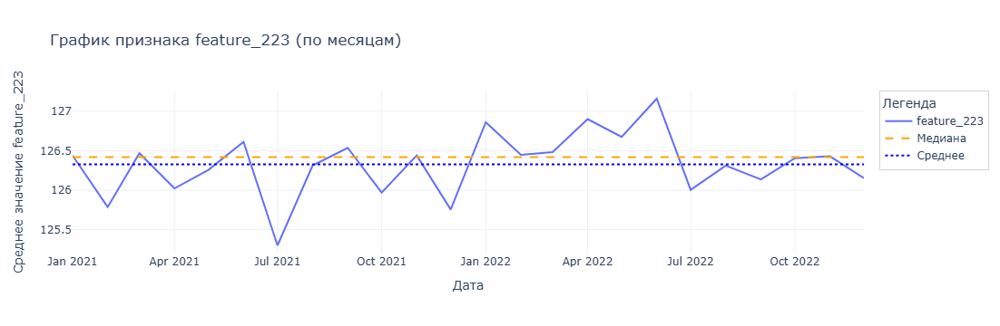

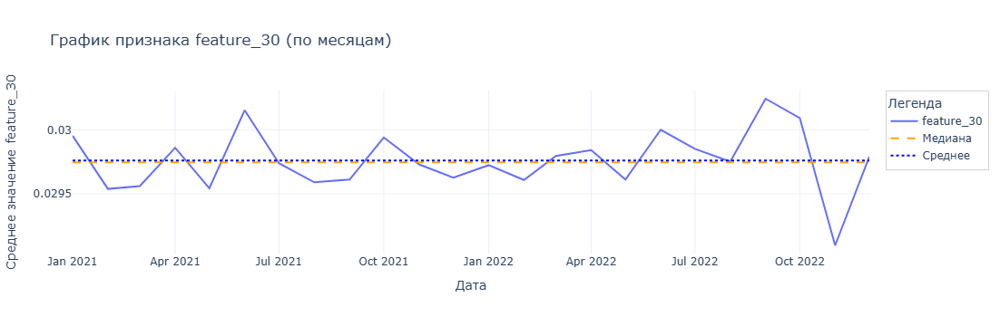

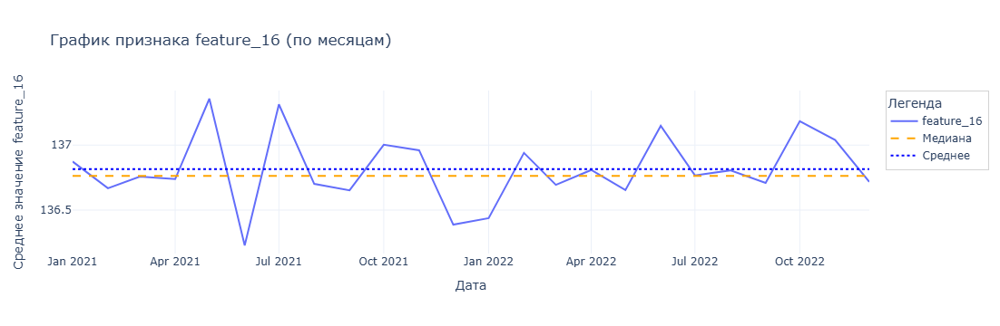

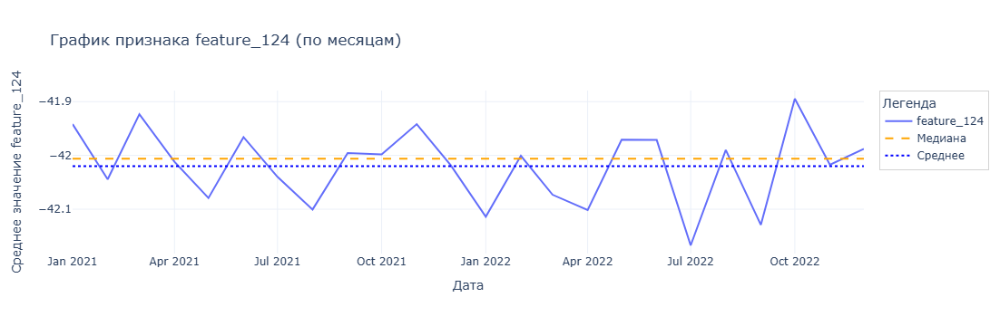

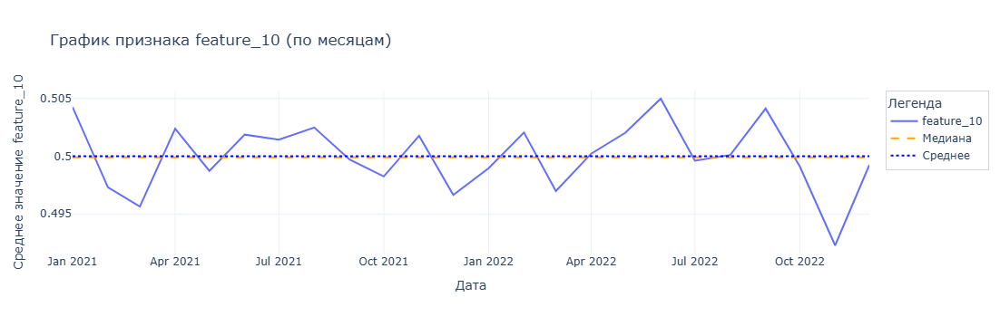

...

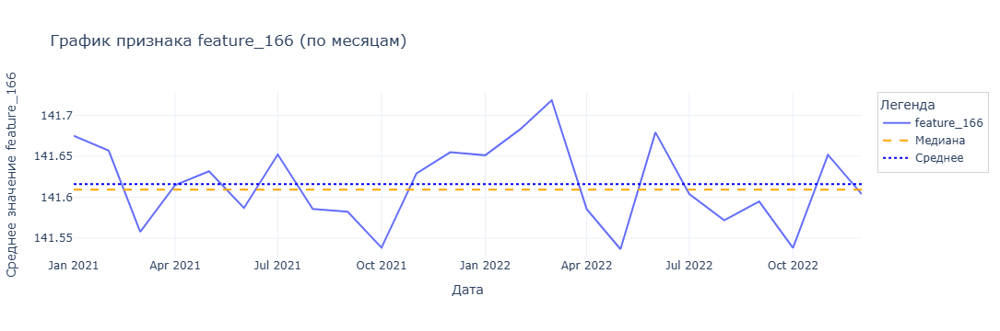

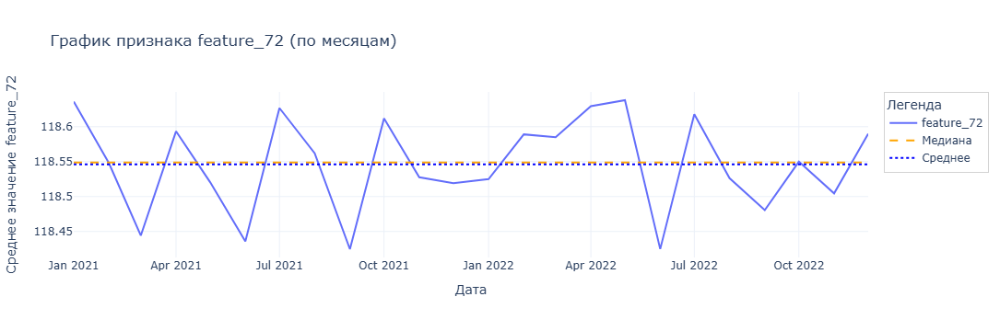

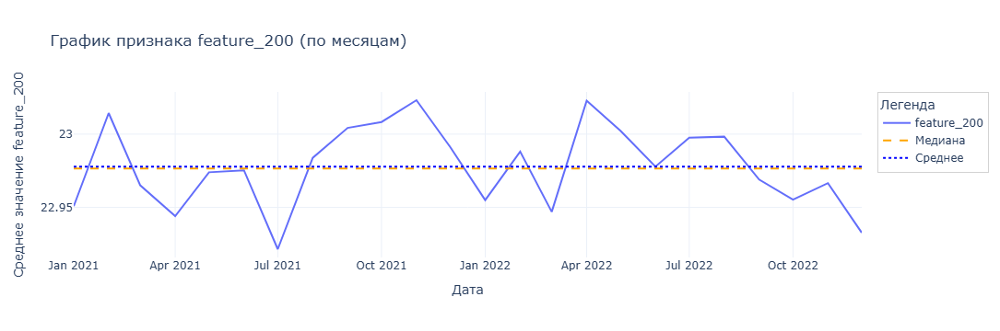

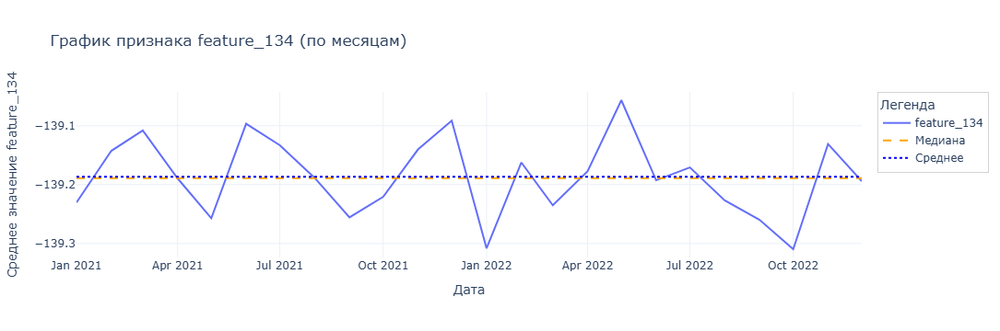

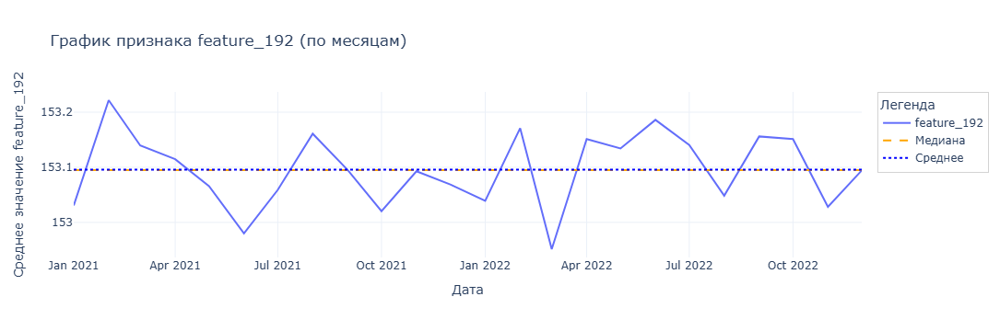

In [607]:
for column_name in df_missed_values_list:
    if column_name in df.columns:
        tmp = (
            df[["month", column_name]]
            .groupby("month", sort=True)[column_name]
            .mean()
            .reset_index()
            .rename(columns={"month": "date"})
        )

        plotly_single_feature(
            df=tmp,
            column=column_name,
            index_col="date",
            title=f"График признака {column_name} (по месяцам)",
            yaxis_title=f"Среднее значение {column_name}",
        )

#### Выводы: ощущается временная структура, поэтому я все-таки экстраполирую (пропусков не очень много).

#### Полиномиальная интерполяция 2-го порядка для заполнения пропусков

In [638]:
df_missed_values_list.dtypes

feature_223    float64
feature_30     float64
feature_16     float64
feature_124    float64
feature_10     float64
feature_68     float64
feature_136    float64
feature_28     float64
feature_115    float64
feature_51     float64
feature_140    float64
feature_78     float64
feature_161    float64
feature_224    float64
feature_228    float64
feature_220    float64
feature_163    float64
feature_62     float64
feature_172    float64
feature_175    float64
feature_148    float64
feature_205    float64
feature_3      float64
feature_105    float64
feature_53     float64
feature_133    float64
feature_207    float64
feature_176    float64
feature_212    float64
feature_49     float64
feature_80     float64
feature_34     float64
feature_7      float64
feature_110    float64
feature_91     float64
feature_83     float64
feature_203    float64
feature_208    float64
feature_89     float64
feature_8      float64
feature_13     float64
feature_59     float64
feature_196    float64
feature_131

#### ВАЖНО! Лучше использовать полиномиальную аппроксимацию, но она считается заметно дольше, поэтому использую линейную!

In [647]:
if isinstance(df_missed_values_list, pd.DataFrame):
    cols = df_missed_values_list.columns.tolist()
else:
    cols = df_missed_values_list.index.tolist()

cols = [c for c in cols if c in train.columns]

train = train.sort_values("date").copy()
val   = val.sort_values("date").copy()
test  = test.sort_values("date").copy()

train.loc[:, cols] = train[cols].interpolate(method="linear", order=2, limit_direction="both")
val.loc[:, cols]   = val[cols].interpolate(method="linear", order=2, limit_direction="both")
test.loc[:, cols]  = test[cols].interpolate(method="linear", order=2, limit_direction="both")

In [653]:
miss_train = train.isna().sum()
miss_val   = val.isna().sum()
miss_test  = test.isna().sum()

print("TRAIN missing (total):", int(miss_train.sum()))
print("VAL   missing (total):", int(miss_val.sum()))
print("TEST  missing (total):", int(miss_test.sum()))

display(miss_train[miss_train > 0].sort_values(ascending=False).head(30))
display(miss_val[miss_val > 0].sort_values(ascending=False).head(30))
display(miss_test[miss_test > 0].sort_values(ascending=False).head(30))

miss_summary = (
    pd.DataFrame({
        "miss_train": miss_train,
        "miss_val": miss_val,
        "miss_test": miss_test,
    })
    .assign(
        miss_total=lambda d: d["miss_train"] + d["miss_val"] + d["miss_test"]
    )
    .query("miss_total > 0")
    .sort_values("miss_total", ascending=False)
)

miss_summary.head(50)

TRAIN missing (total): 17260
VAL   missing (total): 6822
TEST  missing (total): 10393


feature_30_squared    17260
dtype: int64

feature_30_squared    6822
dtype: int64

feature_30_squared    10393
dtype: int64

,miss_train,miss_val,miss_test,miss_total
feature_30_squared,17260,6822,10393,34475


In [655]:
col = "feature_30_squared"

train = train.sort_values("date").copy()
val   = val.sort_values("date").copy()
test  = test.sort_values("date").copy()

train[col] = (
    train.set_index("date")[col]
         .interpolate(method="time", limit_direction="both")
         .to_numpy()
)

val[col] = (
    val.set_index("date")[col]
       .interpolate(method="time", limit_direction="both")
       .to_numpy()
)

test[col] = (
    test.set_index("date")[col]
        .interpolate(method="time", limit_direction="both")
        .to_numpy()
)

Вспомним про категориальные признаки, их нужно закодировать.

**Задание:** Используя `OneHotEncoder` закодируйте категориальные признаки.

#### Я уже закодировал признаки, используя порядоковое кодирование, но попробуем написать псевдо-код! Почему? Очень много уже признаков, боюсь, можно спутать используемые признаки и пр.

```from sklearn.preprocessing import OneHotEncoder```

```
# например! были они прямо category, но вообще логику описывал ранее, надо брать не только их!
cat_cols = ["feature_0", "feature_209"]

enc = OneHotEncoder(handle_unknown="ignore", sparse_output=False)

X_train_cat = enc.fit_transform(train[cat_cols])
X_val_cat   = enc.transform(val[cat_cols])
X_test_cat  = enc.transform(test[cat_cols])

ohe_cols = enc.get_feature_names_out(cat_cols)

train_ohe = pd.DataFrame(X_train_cat, columns=ohe_cols, index=train.index)
val_ohe   = pd.DataFrame(X_val_cat,   columns=ohe_cols, index=val.index)
test_ohe  = pd.DataFrame(X_test_cat,  columns=ohe_cols, index=test.index)

train = pd.concat([train.drop(columns=cat_cols), train_ohe], axis=1)
val   = pd.concat([val.drop(columns=cat_cols),   val_ohe], axis=1)
test  = pd.concat([test.drop(columns=cat_cols),  test_ohe], axis=1)
```

## Stepwise и обучение логрега (4 балла)

**Задание (boss)**: Реализуйте Stepwise-алгоритм.

Ваша функция `stepwise` должна принимать на вход:
- Датафрейм со всеми признаками и таргетом
- список с именами рассматриваемых признаков
- строку-имя таргета
- уровни значимости `alpha_in` и `alpha_out`

И возвращать список отобранных признаков.

Во время работы пусть она также выводит, какой признак был включён или исключён и с каким `p-value`

In [670]:
from scipy.stats.distributions import chi2
from sklearn.metrics import log_loss

In [724]:
def likelihood_ratio_test(ll_short, ll_long):
    
    """
    вспомогательная функция
    рассчитывает значение p-value для теста отношения правдоподобия
    ll_short — логарифм правдоподобия модели на k переменных
    ll_long — логарифм правдоподобия модели на k+1 переменной

    Returns
    -----
    p-value
    """
    # тут ошибка была!!! не тот порядок!
    # lr = 2 * (ll_short - ll_long)
    lr = 2 * (ll_long - ll_short)
    return chi2.sf(lr, 1)

In [726]:
def stepwise(
        df: pd.DataFrame,
        features: list[str],
        target: str,
        alpha_in: float = 0.01,
        alpha_out: float = 0.05
) -> list[str]:

    features = list(features)
    selected_features = list()

    def fit_ll(cols):
        cols = list(cols)
        use_cols = cols + [target]
        d = df[use_cols].dropna()

        y = d[target].astype(int).to_numpy()
        n = len(y)

        if n == 0:
            return np.nan

        if len(cols) == 0:
            p = np.full(n, y.mean() if n > 0 else 0.5)
            ll = -n * log_loss(y, p, labels=[0, 1])
            return ll

        X = d[cols].to_numpy()
        clf = LogisticRegression(
            penalty="l2",
            C=1e6,             
            solver="lbfgs",
            max_iter=2000,
            n_jobs=-1
        )
        clf.fit(X, y)
        p = clf.predict_proba(X)[:, 1]
        ll = -n * log_loss(y, p, labels=[0, 1])
        return ll

    while True:

        # forward:
        best_feature = None
        if (len(selected_features) < len(features)):

            ll_short = fit_ll(selected_features)

            best_p = np.inf
            for f in features:
                if f in selected_features:
                    continue

                ll_long = fit_ll(selected_features + [f])
                if np.isnan(ll_short) or np.isnan(ll_long):
                    continue

                p = likelihood_ratio_test(ll_short, ll_long)
                if p < best_p:
                    best_p = p
                    best_feature = f

            if best_feature and (best_p < alpha_in):
                selected_features.append(best_feature)
                p_value = best_p
                print(f"В модель была добавлена переменная {best_feature}, p-value: {round(p_value, 6)}")
            else:
                best_feature = None  

        # backward
        worst_feature = None
        if (len(selected_features) > 1):

            ll_long = fit_ll(selected_features)

            worst_p = -np.inf
            for f in list(selected_features):
                cols_short = [c for c in selected_features if c != f]
                ll_short = fit_ll(cols_short)

                if np.isnan(ll_short) or np.isnan(ll_long):
                    continue

                p = likelihood_ratio_test(ll_short, ll_long)  
                if p > worst_p:
                    worst_p = p
                    worst_feature = f

            if worst_feature and (worst_p > alpha_out):
                selected_features.remove(worst_feature)
                p_value = worst_p
                print(f"Из модели была удалена переменная {worst_feature}, p-value: {round(p_value, 6)}")
            else:
                worst_feature = None

        if not (best_feature or worst_feature):
            break

    return selected_features

Запустите ваш алгоритм на отобранных фичах со значениями `alpha_in = 0.01`, `alpha_out = 0.02`

Если в степвайз заходят *все переменные*, причём с очень маленькими `p-value` - это неудивительно, ведь вы уже провели серьёзный предварительный отбор фичей.

Чтобы убедиться в коректности работы своего алгоритма, можете попробовать запустить его на каких-нибудь других фичах, откинутых сильно ранее

In [677]:
# selected_features = stepwise(..., ..., ..., alpha_in = 0.01, alpha_out = 0.02)

#### Идея: мы сформировали достаточно маленький датасет после всех обработок (и обработки именно признаков из списка по gain). А давайте как в классическом эконометрическом исследовании и рассмотрим данное признаковое подпространство!

#### Спойлер: немного не хватило, чтобы побить метрику. Идея была не самая лучшая!

In [728]:
alpha_in, alpha_out = 0.01, 0.02

selected = stepwise(
    df=train,
    features=final_features_logreg,
    target=TARGET,
    alpha_in=alpha_in,
    alpha_out=alpha_out
)

print("Итоговые признаки:", len(selected))
print(selected)

В модель была добавлена переменная feature_117, p-value: 0.0
В модель была добавлена переменная feature_124, p-value: 0.0
В модель была добавлена переменная feature_30_squared, p-value: 0.0
В модель была добавлена переменная feature_76_squared, p-value: 0.0


KeyboardInterrupt: 

**Очень долго идет обработка, конечно! Но работает! Прерву, ноутбук не тянет...**

**Задание**: На получившемся наборе признаков обучим, наконец, логрег!

Для обучения можно использовать трейн + валидацию вместе, либо просто трейн

*Не забудьте отскалировать фичи*

In [687]:
from sklearn.preprocessing import StandardScaler # Или другой скейлер
from sklearn.linear_model import LogisticRegression
from scipy.special import logit

#### Заново прогоним пайплайн

In [713]:
le_cols = ["feature_0", "feature_209", "feature_10", "feature_161", "feature_62"]

for c in le_cols:
    train[c] = train[c].astype("object").where(train[c].notna(), "missing").astype(str)
    val[c]   = val[c].astype("object").where(val[c].notna(), "missing").astype(str)
    test[c]  = test[c].astype("object").where(test[c].notna(), "missing").astype(str)

for c in le_cols:
    codes, uniques = pd.factorize(train[c], sort=True)
    mapping = {cat: i for i, cat in enumerate(uniques)}
    
    train[c + "_le"] = train[c].map(mapping).astype("int32")
    val[c + "_le"]   = val[c].map(mapping).fillna(-1).astype("int32")
    test[c + "_le"]  = test[c].map(mapping).fillna(-1).astype("int32")

In [730]:
# scaler = StandardScaler()
# scaler.fit(...)
# # your code here
# logreg = LogisticRegression(penalty=None)
# logreg.fit(...)
# df_for_logreg['logreg'] = logreg.predict_proba(...)[:, 1]
# df_for_logreg['logit_logreg'] = logit(df_for_logreg['logreg'])

# список фичей
features_lr = features_final

X_trainval = pd.concat([train[features_lr], val[features_lr]], axis=0)
y_trainval = pd.concat([train[TARGET], val[TARGET]], axis=0).astype(int)

scaler = StandardScaler()
scaler.fit(X_trainval)

X_trainval_sc = scaler.transform(X_trainval)
logreg = LogisticRegression(penalty=None, max_iter=5000)
logreg.fit(X_trainval_sc, y_trainval)


# train
X_tr = scaler.transform(train[features_lr])
train = train.copy()
train["logreg"] = logreg.predict_proba(X_tr)[:, 1]
train["logit_logreg"] = logit(np.clip(train["logreg"], 1e-12, 1-1e-12))

# val
X_va = scaler.transform(val[features_lr])
val = val.copy()
val["logreg"] = logreg.predict_proba(X_va)[:, 1]
val["logit_logreg"] = logit(np.clip(val["logreg"], 1e-12, 1-1e-12))

# test
X_te = scaler.transform(test[features_lr])
test = test.copy()
test["logreg"] = logreg.predict_proba(X_te)[:, 1]
test["logit_logreg"] = logit(np.clip(test["logreg"], 1e-12, 1-1e-12))

**Задание:** Оцените качество получившегося логрега **на тестовой выборке** по метрике `roc_auc`. 

**Ваша задача - побить** `threshold_auc = 0.622`. Если этого сделать ну совсем не получается, попробуйте добавить в модель ещё переменных (но должно получаться :)

**Также:**

- Постройте графики линейности по WoE получившегося логрега на трейне и тестовой выборке (оценивайте линейность для `logit_logreg`, а не для вероятности!)
- Постройте график стабильности `roc_auc` во времени для получившегося логрега

In [736]:
threshold_auc = 0.622

# AUC на test
X_test_sc = scaler.transform(test[features_lr])
preds_test = logreg.predict_proba(X_test_sc)[:, 1]
auc_test = roc_auc_score(test[TARGET].astype(int), preds_test)

print(f"ROC-AUC on test: {auc_test:.4f} (threshold {threshold_auc})")

ROC-AUC on test: 0.6376 (threshold 0.622)


#### УРА!

**Задание:** Визуализируйте важность фичей полученной линейной модели.

**Также:**

- Постройте графики линейности по WoE получившегося логрега на трейне и тестовой выборке (оценивайте линейность для `logit_logreg`, а не для вероятности!)
- Постройте график стабильности `roc_auc` во времени для получившегося логрега

### WOE

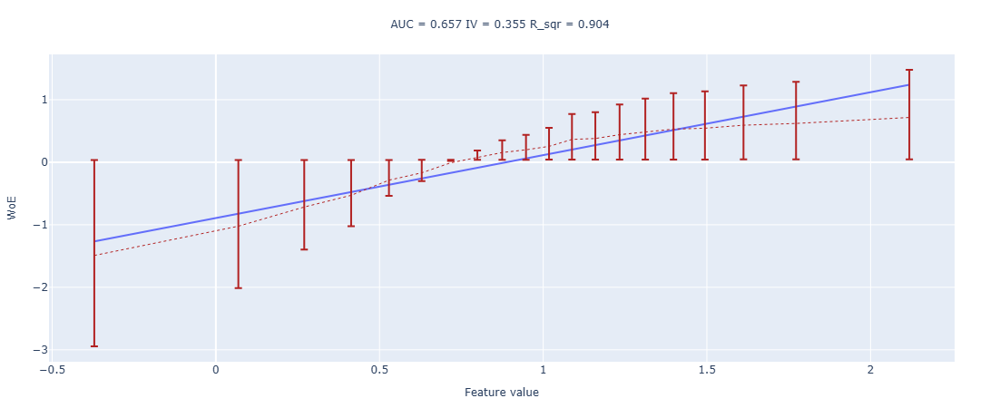

In [747]:
m = train["logit_logreg"].notna() & train[TARGET].notna()

fig_tr = woe_line(
    values=train.loc[m, "logit_logreg"].to_numpy(),
    target=train.loc[m, TARGET].astype(int).to_numpy(),
    n_buckets=20
)
fig_tr.show()

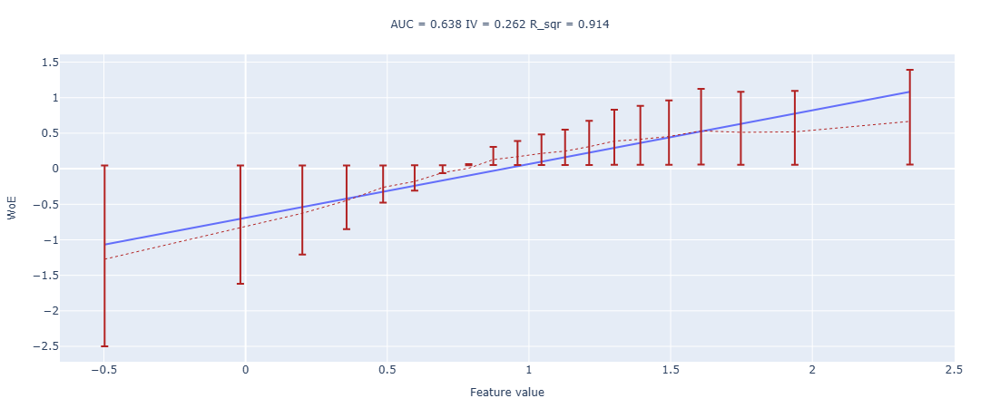

In [749]:
m = test["logit_logreg"].notna() & test[TARGET].notna()

fig_te = woe_line(
    values=test.loc[m, "logit_logreg"].to_numpy(),
    target=test.loc[m, TARGET].astype(int).to_numpy(),
    n_buckets=20
)
fig_te.show()

#### ROC-AUC

In [742]:
features_lr = final_features_logreg

def plot_auc_time(df_part, time_col="month", score_col="logit_logreg", target_col=TARGET, title=""):
    tmp = df_part[[time_col, score_col, target_col]].dropna()
    auc_by_t = (
        tmp.groupby(time_col, sort=True)
           .apply(lambda g: roc_auc_score(g[target_col].astype(int), g[score_col]))
    )

    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=auc_by_t.index.astype(str),
        y=auc_by_t.values,
        mode="markers+lines",
        name=f"AUC by {time_col}"
    ))
    fig.update_layout(
        title_text=title or f"ROC-AUC stability over time ({time_col})",
        yaxis=dict(title="roc_auc", rangemode="tozero"),
        width=1000,
        height=450,
        xaxis=dict(showgrid=True),
        margin=dict(l=30, r=30, b=30, t=50),
    )
    fig.show()

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\2958800306.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



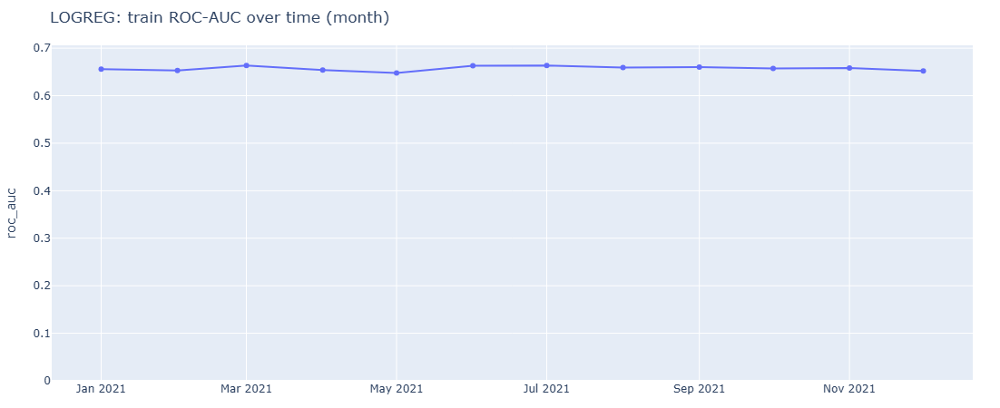

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\2958800306.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



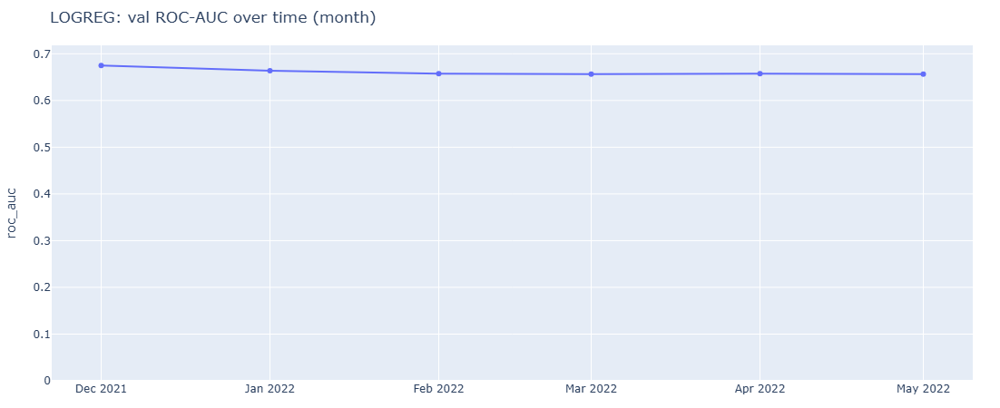

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\2958800306.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



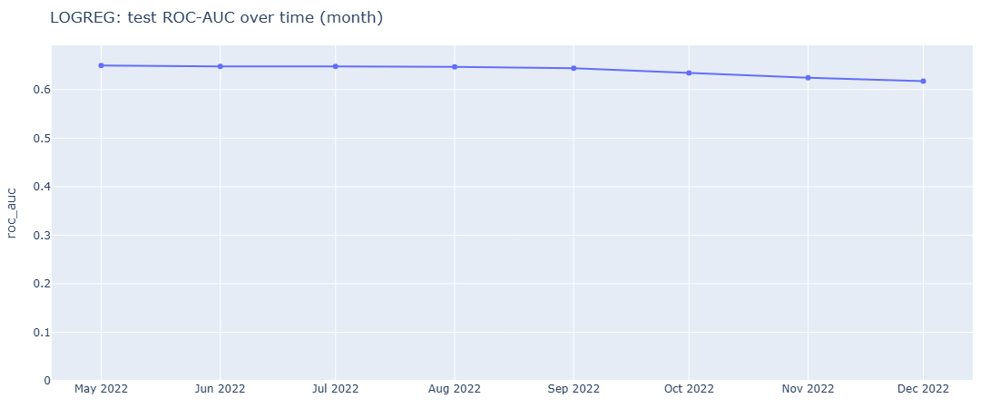

In [744]:
plot_auc_time(train, time_col="month", title="LOGREG: train ROC-AUC over time (month)")
plot_auc_time(val,   time_col="month", title="LOGREG: val ROC-AUC over time (month)")
plot_auc_time(test,  time_col="month", title="LOGREG: test ROC-AUC over time (month)")

#### Выводы:

logit_logreg демонстрирует почти линейную и монотонную зависимость по WoE и на train, и на test (R^2 примерно 0.9), а шум в основном в крайних бакетах из-за малого числа наблюдений.

AUC на тесте ниже, чем на трейне (0.638 и 0.657 соответственно), но падение умеренное - модель обобщается нормально.

По времени ROC-AUC на трейне стабилен, а на тесте заметен лёгкий нисходящий тренд к концу периода, что похоже на дрейф данных / их деградацию.

# Бонусная часть (до 5 баллов)

В разделе про бустинг мы обучали `LGBMClassifier` на довольно большом наборе фичей. Их количество можно сократить, при этом не теряя в качестве модели.

За начальный набор признаков можно взять все признаки (все 230) или признаки после отбора по IV.

**Ваша задача:** Отобрать признаки, подобрать оптимальные гиперпараметры и обучить `LGBMClassifier`.

Задание творческое) Можно использовать любые методы отбора признаков / оптимизации гиперпараметров.

**Чем меньше признаков, без ухудшения качества модели – тем лучше.**

Идеи для отбора признаков:

- Воспользоваться методами из модуля `sklearn.feature_selection` (точно можно попробовать RFE). Документация https://scikit-learn.org/stable/modules/feature_selection.html
- С помощью `BorutaPy` из библиотеки `boruta` (https://towardsdatascience.com/simple-example-using-boruta-feature-selection-in-python-8b96925d5d7a – статья может помочь разобраться с запуском алгоритма (мб не откроется без vpn))

In [ ]:
# your answere here

#### Попробую использовать Permutation Importance и SHAP вместе!

### SHAP
#### Используем для начала интерпретацию для простой модели; после - кластеризуем (иерархическая кластеризация) по корреляции получившийся признаковый набор!

In [ ]:
import warnings
from typing import Optional, Union, Tuple

import matplotlib.pyplot as plt

import shap

In [760]:
def calculate_shap_feature_importance_lgbm(
    X_train: pd.DataFrame,
    y_train: Union[pd.Series, np.ndarray],
    X_shap: Optional[pd.DataFrame] = None,
    y_shap: Optional[Union[pd.Series, np.ndarray]] = None,
    model_params: Optional[dict] = None,
    max_display: int = 30,
    plot: bool = True,
    sample_size: int = 1000,
    target_name: Optional[str] = None,
    plot_type: str = "bar",  
    sampling_strategy: str = "last", 
    shap_mode: str = "interventional",  # тут "interventional" or "tree_path_dependent"
    random_state: int = 42,
) -> Tuple[pd.DataFrame, np.ndarray]:
    """
    Fit LGBMClassifier on X_train/y_train and compute SHAP values on X_shap.

    Notes for LightGBM + SHAP:
    - shap_mode controls feature_perturbation in TreeExplainer.
      "interventional" is more robust with correlated features but requires background data.
    - For binary classification, TreeExplainer may return:
        * array of shape (n_samples, n_features)  (often for model_output="raw")
        * or list of two arrays [class0, class1]; we take class1.
    """

    assert shap_mode in ["tree_path_dependent", "interventional"], \
        "shap_mode must be 'tree_path_dependent' or 'interventional'"

    assert isinstance(X_train, pd.DataFrame), "X_train must be a pandas DataFrame"
    assert isinstance(y_train, (pd.Series, np.ndarray)), "y_train must be Series or ndarray"
    assert X_train.shape[0] == len(y_train), "X_train and y_train must have the same number of samples"

    if model_params is None:
        model_params = {
            "n_estimators": 600,
            "learning_rate": 0.05,
            "num_leaves": 63,
            "max_depth": -1,
            "subsample": 0.8,          
            "subsample_freq": 1,       
            "colsample_bytree": 0.8,   
            "reg_alpha": 0.0,          
            "reg_lambda": 0.0,        
            "random_state": random_state,
            "n_jobs": -1,
        }

    if X_shap is None:
        X_shap = X_train.copy()
        y_shap = y_train

  
    if X_shap.shape[0] > sample_size:
        warnings.warn(
            f"X_shap contains {X_shap.shape[0]} rows. Sampling {sample_size} rows for SHAP.",
            UserWarning
        )
        if sampling_strategy == "last":
            X_sample = X_shap.iloc[-sample_size:].copy()
            if y_shap is not None:
                if isinstance(y_shap, pd.Series):
                    y_sample = y_shap.iloc[-sample_size:]
                else:
                    y_sample = y_shap[-sample_size:]
            else:
                y_sample = None
        elif sampling_strategy == "random":
            X_sample = X_shap.sample(n=sample_size, random_state=random_state)
            if y_shap is not None:
                if isinstance(y_shap, pd.Series):
                    y_sample = y_shap.loc[X_sample.index]
                else:
                    y_sample = y_shap[X_sample.index.to_numpy()]
            else:
                y_sample = None
        else:
            raise ValueError(f"Unknown sampling_strategy: {sampling_strategy}")
    else:
        X_sample = X_shap.copy()
        y_sample = y_shap

    model = LGBMClassifier(**model_params)
    model.fit(X_train, y_train)

    # For interventional SHAP you MUST provide background data.
    # Using X_train is correct, but can be heavy; if needed you can pass a subsample later.
    if shap_mode == "interventional":
        explainer = shap.TreeExplainer(
            model,
            data=X_train,
            feature_perturbation="interventional",
            model_output="raw"
        )
    else:
        explainer = shap.TreeExplainer(
            model,
            feature_perturbation="tree_path_dependent",
            model_output="raw"
        )

    shap_values = explainer.shap_values(X_sample)

    if isinstance(shap_values, list):
        if len(shap_values) > 1:
            shap_values = shap_values[1]
        else:
            shap_values = shap_values[0]

    shap_values = np.asarray(shap_values)

    assert shap_values.shape[1] == X_sample.shape[1], \
        "Mismatch between SHAP values and feature dimensions."

    if plot:
        title = f"SHAP summary plot{' for ' + target_name if target_name else ''}"
        print(title)

        if plot_type == "beeswarm":
            shap.summary_plot(
                shap_values,
                X_sample,
                max_display=max_display,
                plot_type="dot",
                show=False
            )
        else:
            shap.summary_plot(
                shap_values,
                X_sample,
                max_display=max_display,
                plot_type="bar",
                show=False
            )
        plt.show()

    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    shap_df = (
        pd.DataFrame({"feature": X_sample.columns, "mean_abs_shap": mean_abs_shap})
          .sort_values("mean_abs_shap", ascending=False)
          .reset_index(drop=True)
    )

    return shap_df, shap_values

C:\Users\smirn\AppData\Local\Temp\ipykernel_15040\3361923532.py:66: UserWarning:

X_shap contains 100000 rows. Sampling 1000 rows for SHAP.

100%|===================| 996/1000 [01:06<00:00]        

SHAP summary plot for target


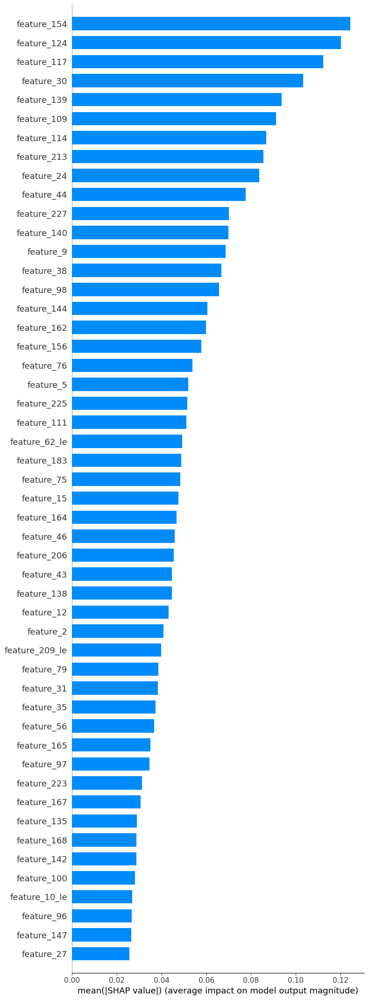

In [761]:
shap_df, shap_values = calculate_shap_feature_importance_lgbm(
    X_train=train[features_final],
    y_train=train["target"],
    X_shap=val[features_final],       
    y_shap=val["target"],
    max_display=50,
    target_name="target",
    sampling_strategy="last",
    shap_mode="interventional",
    plot_type="bar",
)

In [ ]:
from typing import List
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import squareform

In [774]:
def filter_features_by_shap_and_correlation(
    shap_df: pd.DataFrame,
    X: pd.DataFrame,
    threshold: float = 0.9,
    corr_threshold: float = 0.9,
    min_features: int = 1,
) -> List[str]:

    required_cols = {"feature", "mean_abs_shap"}
    if not required_cols.issubset(shap_df.columns):
        raise ValueError(f"shap_df must contain columns {required_cols}")

    shap_tbl = (
        shap_df[["feature", "mean_abs_shap"]]
        .dropna(subset=["feature", "mean_abs_shap"])
        .copy()
    )
    shap_tbl = shap_tbl[shap_tbl["feature"].isin(X.columns)]
    if shap_tbl.empty:
        return []

    shap_tbl = shap_tbl.sort_values("mean_abs_shap", ascending=False).reset_index(drop=True)

    total = float(shap_tbl["mean_abs_shap"].sum())
    if total <= 0:
        return shap_tbl["feature"].head(max(min_features, 1)).tolist()

    shap_tbl["cumulative"] = shap_tbl["mean_abs_shap"].cumsum() / total

    idx = np.where(shap_tbl["cumulative"].values <= threshold)[0]
    if idx.size == 0:
        k = max(min_features, 1)
    else:
        k = max(int(idx.max() + 2), min_features)
    k = min(k, shap_tbl.shape[0])

    selected_features = shap_tbl["feature"].iloc[:k].tolist()

    X_selected = X[selected_features].copy()
    X_selected = X_selected.apply(pd.to_numeric, errors="coerce")
    X_selected = X_selected.replace([np.inf, -np.inf], np.nan)

    nun = X_selected.nunique(dropna=True)
    X_selected = X_selected.loc[:, nun[nun > 1].index]
    selected_features = X_selected.columns.tolist()

    if len(selected_features) <= 1:
        return selected_features

    corr = X_selected.corr(method="pearson", min_periods=2).abs().fillna(0.0)
    corr = corr.clip(lower=0.0, upper=1.0)

    dist = 1.0 - corr
    dist = (dist + dist.T) / 2.0
    np.fill_diagonal(dist.values, 0.0)
    dist = dist.clip(lower=0.0, upper=1.0)

    condensed = squareform(dist.values, checks=False)
    linkage_matrix = linkage(condensed, method="average")
    clusters = fcluster(linkage_matrix, t=1.0 - corr_threshold, criterion="distance")

    cluster_df = pd.DataFrame({"feature": corr.index.tolist(), "cluster": clusters})

    shap_map = shap_tbl.set_index("feature")["mean_abs_shap"]

    retained = []
    for cluster_id, grp in cluster_df.groupby("cluster"):
        feats = grp["feature"].tolist()
        best_feat = max(feats, key=lambda f: float(shap_map.get(f, -np.inf)))
        retained.append(best_feat)

    retained = sorted(retained, key=lambda f: float(shap_map.get(f, -np.inf)), reverse=True)
    return retained

In [776]:
selected_features_lgbm = filter_features_by_shap_and_correlation(
    shap_df=shap_df,
    X=val[features_final],
    threshold=0.5,
    corr_threshold=0.9999
)
print(len(selected_features_lgbm))
print(selected_features_lgbm[:50])

19
['feature_154', 'feature_124', 'feature_117', 'feature_30', 'feature_139', 'feature_109', 'feature_114', 'feature_213', 'feature_24', 'feature_44', 'feature_227', 'feature_140', 'feature_9', 'feature_38', 'feature_98', 'feature_144', 'feature_162', 'feature_156', 'feature_76']


### Применим, гиперпараметры оставим прежние, так как инкремент малый будет, а перебор с ноутбука, который считает локально, очень долгий...

In [781]:
params = study.best_params

clf = LGBMClassifier(**params)

clf.fit(
    X=train[selected_features_lgbm],
    y=train[TARGET]
)

preds = clf.predict_proba(val[selected_features_lgbm])[:, 1]
auc_valid = roc_auc_score(
    y_true=val[TARGET],
    y_score=preds
)

clf = LGBMClassifier(**study.best_params)

clf.fit(
    X=train[selected_features_lgbm],
    y=train[TARGET]
)

LGBMClassifier(bagging_fraction=0.6072608207402718, bagging_freq=10,
               feature_fraction=0.6349898354943739,
               lambda_l1=0.0002798699047466125, lambda_l2=7.151765760948411e-08,
               learning_rate=0.022511004517451885, max_depth=10,
               n_estimators=2485, num_leaves=96)

In [ ]:
preds_test = clf.predict_proba(test[selected_features_lgbm])[:, 1]
auc_test = roc_auc_score(
    y_true=test[TARGET],
    y_score=preds_test
)

assert auc_test > 0.725, f"Необходимое значение ROC-AUC 0.725 и выше, ваше значение: {auc_test}!"

In [782]:
# 0.7395093065500715 - старый auc_test
# новый:
print(auc_test)

0.6375542380009138


### А если не кластеризовать, а просто взять топ?

In [786]:
shap_df

,feature,mean_abs_shap
0,feature_154,0.124
1,feature_124,0.120
2,feature_117,0.112
3,feature_30,0.103
4,feature_139,0.094
5,feature_109,0.091
6,feature_114,0.087
7,feature_213,0.085
8,feature_24,0.084
9,feature_44,0.078


In [788]:
top35_features = (
    shap_df.sort_values("mean_abs_shap", ascending=False)
           .head(35)["feature"]
           .tolist()
)

print("Top-35:", len(top35_features))
print(top35_features)

Top-35: 35
['feature_154', 'feature_124', 'feature_117', 'feature_30', 'feature_139', 'feature_109', 'feature_114', 'feature_213', 'feature_24', 'feature_44', 'feature_227', 'feature_140', 'feature_9', 'feature_38', 'feature_98', 'feature_144', 'feature_162', 'feature_156', 'feature_76', 'feature_5', 'feature_225', 'feature_111', 'feature_62_le', 'feature_183', 'feature_75', 'feature_15', 'feature_164', 'feature_46', 'feature_206', 'feature_43', 'feature_138', 'feature_12', 'feature_2', 'feature_209_le', 'feature_79']


In [790]:
params = study.best_params

clf = LGBMClassifier(**params)

clf.fit(
    X=train[top35_features],
    y=train[TARGET]
)

preds = clf.predict_proba(val[top35_features])[:, 1]
auc_valid = roc_auc_score(
    y_true=val[TARGET],
    y_score=preds
)

clf = LGBMClassifier(**study.best_params)

clf.fit(
    X=train[top35_features],
    y=train[TARGET]
)

LGBMClassifier(bagging_fraction=0.6072608207402718, bagging_freq=10,
               feature_fraction=0.6349898354943739,
               lambda_l1=0.0002798699047466125, lambda_l2=7.151765760948411e-08,
               learning_rate=0.022511004517451885, max_depth=10,
               n_estimators=2485, num_leaves=96)

In [791]:
preds_test = clf.predict_proba(test[top35_features])[:, 1]
auc_test = roc_auc_score(
    y_true=test[TARGET],
    y_score=preds_test
)

assert auc_test > 0.725, f"Необходимое значение ROC-AUC 0.725 и выше, ваше значение: {auc_test}!"

AssertionError: Необходимое значение ROC-AUC 0.725 и выше, ваше значение: 0.6933898341129493!

#### А если попробуем Permutation Importance?

In [794]:
def permutation_importance(
    X_train, y_train, X_test, y_test,
    n_repeats=10, threshold=0.01, metric='accuracy',
    n_top_features=None, plot=True
):
    """
    Реализация алгоритма важности на основе перестановок (permutation importance)
    с внешними train/test выборками.
    """

    if metric not in ['accuracy', 'roc_auc']:
        raise ValueError("Метрика должна быть 'accuracy' или 'roc_auc'")


    model = DecisionTreeClassifier(max_depth=5, random_state=42)
    
    model.fit(X_train, y_train)

    # Предсказания на тестовой выборке
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if metric == 'roc_auc' else None

    # Вычисляем базовую метрику
    if metric == 'accuracy':
        baseline_score = accuracy_score(y_test, y_pred)
    else:
        baseline_score = roc_auc_score(y_test, y_pred_proba)

    print(f"Базовая {metric} модели: {baseline_score:.4f}")

    feature_importance = {}
    feature_scores = {}

    for feature in X_test.columns:
        importance_scores = []
        permuted_scores = []

        for _ in range(n_repeats):
            X_test_permuted = X_test.copy()
            X_test_permuted[feature] = np.random.permutation(X_test_permuted[feature].values)

            y_pred_permuted = model.predict(X_test_permuted)

            if metric == 'accuracy':
                permuted_score = accuracy_score(y_test, y_pred_permuted)
            else:
                y_pred_proba_permuted = model.predict_proba(X_test_permuted)[:, 1]
                permuted_score = roc_auc_score(y_test, y_pred_proba_permuted)

            permuted_scores.append(permuted_score)
            importance_scores.append(baseline_score - permuted_score)

        feature_importance[feature] = np.mean(importance_scores)
        feature_scores[feature] = np.mean(permuted_scores)

    importance_df = pd.DataFrame({
        'feature': list(feature_importance.keys()),
        'importance': list(feature_importance.values()),
        'permuted_score': list(feature_scores.values())
    }).sort_values('importance', ascending=False)

    importance_df['percent_decrease'] = (importance_df['importance'] / baseline_score) * 100

    def get_justification(row):
        if row['importance'] <= 0:
            return "Признак не влияет на качество модели или его перемешивание улучшает модель"
        elif row['percent_decrease'] < 1:
            return "Незначительное влияние на модель (менее 1% снижения метрики)"
        elif row['percent_decrease'] < 5:
            return "Умеренное влияние на модель (1-5% снижения метрики)"
        elif row['percent_decrease'] < 10:
            return "Существенное влияние на модель (5-10% снижения метрики)"
        else:
            return "Критически важный признак (более 10% снижения метрики)"

    importance_df['justification'] = importance_df.apply(get_justification, axis=1)

    if n_top_features is not None:
        selected_features = importance_df.head(n_top_features)['feature'].tolist()
        importance_df['selected'] = importance_df['feature'].isin(selected_features)
    else:
        selected_features = importance_df[importance_df['importance'] > threshold]['feature'].tolist()
        importance_df['selected'] = importance_df['importance'] > threshold

    print("\nВажность признаков (permutation importance):")
    print(importance_df)

    print(f"\nВыбрано {len(selected_features)} признаков:")
    for feature in selected_features:
        row = importance_df[importance_df['feature'] == feature].iloc[0]
        print(f"- {feature}: важность = {row['importance']:.4f}, "
              f"снижение метрики = {row['percent_decrease']:.2f}%, "
              f"обоснование: {row['justification']}")

    if plot and not importance_df.empty:
        plt.figure(figsize=(12, 8))
        colors = ['green' if selected else 'gray' for selected in importance_df['selected']]
        sorted_df = importance_df.sort_values('importance')
        plt.barh(sorted_df['feature'], sorted_df['importance'], color=colors)
        if n_top_features is None:
            plt.axvline(x=threshold, color='red', linestyle='--', label=f'Пороговое значение ({threshold})')
            plt.legend()
        plt.xlabel('Важность (снижение метрики)')
        plt.ylabel('Признаки')
        plt.title('Permutation Importance признаков')
        plt.grid(axis='x', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show("permutation_importance.png")
        print("График важности признаков сохранен как 'permutation_importance.png'")

    return importance_df, selected_features

In [799]:
from sklearn.tree import DecisionTreeClassifier

Базовая roc_auc модели: 0.6058

Важность признаков (permutation importance):
           feature  importance  permuted_score  percent_decrease  \
11     feature_124       0.025           0.581             4.049   
0   feature_209_le       0.021           0.585             3.454   
2       feature_31       0.016           0.590             2.669   
12     feature_117       0.014           0.592             2.269   
38     feature_140       0.011           0.595             1.804   
9      feature_114       0.007           0.599             1.178   
13      feature_30       0.007           0.599             1.105   
21      feature_38       0.006           0.600             1.035   
16       feature_2       0.005           0.601             0.792   
61     feature_155       0.005           0.601             0.773   
31      feature_43       0.004           0.602             0.668   
64       feature_5       0.004           0.602             0.580   
43     feature_183       0.003         

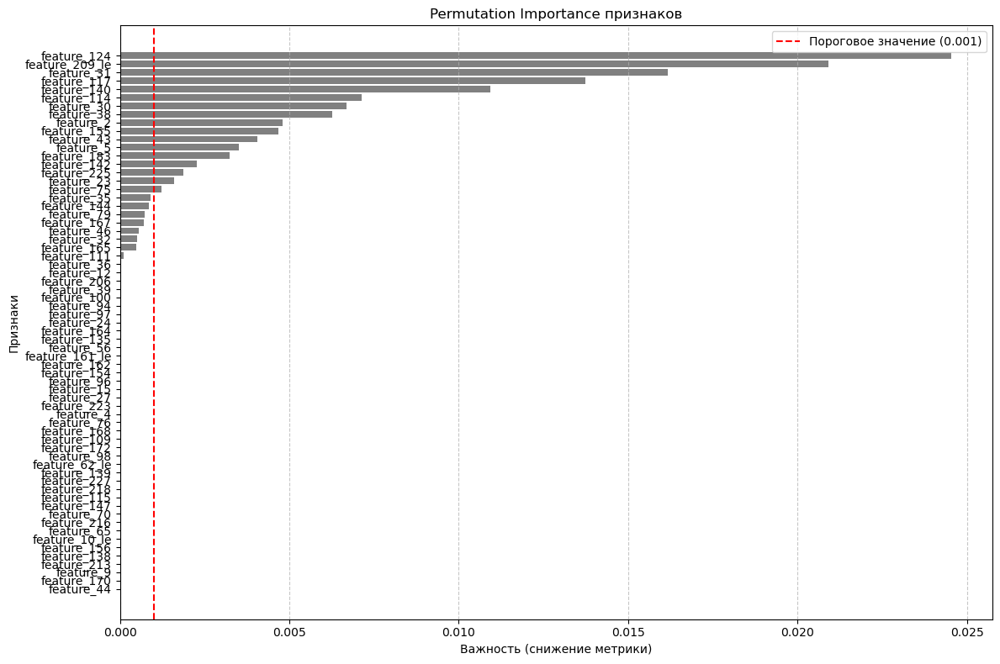

График важности признаков сохранен как 'permutation_importance.png'
Selected by PI: 17
['feature_124', 'feature_209_le', 'feature_31', 'feature_117', 'feature_140', 'feature_114', 'feature_30', 'feature_38', 'feature_2', 'feature_155', 'feature_43', 'feature_5', 'feature_183', 'feature_142', 'feature_225', 'feature_23', 'feature_75']


In [800]:
importance_df, selected_features_pi = permutation_importance(
    X_train=train[features_final],
    y_train=train[TARGET],
    X_test=val[features_final],
    y_test=val[TARGET],
    n_repeats=10,
    threshold=0.001,
    metric="roc_auc",
    n_top_features=None,
    plot=True
)

print("Selected by PI:", len(selected_features_pi))
print(selected_features_pi)

In [804]:
params = study.best_params

clf = LGBMClassifier(**params)

clf.fit(
    X=train[selected_features_pi],
    y=train[TARGET]
)

preds = clf.predict_proba(val[selected_features_pi])[:, 1]
auc_valid = roc_auc_score(
    y_true=val[TARGET],
    y_score=preds
)

clf = LGBMClassifier(**study.best_params)

clf.fit(
    X=train[selected_features_pi],
    y=train[TARGET]
)

preds_test = clf.predict_proba(test[selected_features_pi])[:, 1]
auc_test = roc_auc_score(
    y_true=test[TARGET],
    y_score=preds_test
)

assert auc_test > 0.725, f"Необходимое значение ROC-AUC 0.725 и выше, ваше значение: {auc_test}!"

AssertionError: Необходимое значение ROC-AUC 0.725 и выше, ваше значение: 0.6382026210301834!

#### Выводы

Выбранный признаковый набор уже является достаточно релевантным для задачи. Можно попробовать применить алгоритм на полном наборе данных, но, из-за особенностей обработки, пайплайн необходимо полностью повторить и применить дерево решений на такой большой выборке будет достаточно вычислительно тяжело. Тем не менее, лично для себя я сделал выводы, что отбор по IV является гораздо более понятным для оценки алгоритмов, чем условный SHAP и Permutation. Второй не всегда себя показывает удачно в том или ином контексте и, скорее, является попыткой "прикинуть", чем реально оценить устойчивость признаков во времени. SHAP, в свою очередь, является скорее псевдо-подходом в контексте отбора признаков (хотя, в задачах оценки временных рядов при наличии огромного числа линейно зависимых рядов кластеризация методом иерархической кластеризации показывает себя достаточно интересно и уместно, но, тем не менее, вручную подбирать по порогам признаки крайне тяжело) из-за использования иного базового алгоритма для оценки, нежели по итогу будет в реальной задаче (бустинг с другими параметрами, чем используется по факту), поэтому, подход, скорее, про итоговую интерпретацию важности признаков в модели.

#### Посмотреть эти же функции (но исходники) можно в ноутбуке, ссылку на который давал выше (имею в виду, что в свое время уже писал реализации и использую свой код или код, созданный для других учебных целей, если это имеет значение при проверке)